# Vision Transformers Notebook: DINOv2, DETR, and Swin

This notebook provides practical examples for:

- **DINOv2** (self-supervised visual representations) on an ImageNet-style classification task.
- **DINOv3**
- **DETR** (transformer-based object detection) on COCO.
- **Swin Transformer** (hierarchical ViT) for image classification.

Each section includes:

1. Dataset setup and preprocessing.
2. Model loading and inference/training blocks.
3. Metrics computation and visualization.

At the end, a fine-tuning section shows how to adapt transformer models to your own dataset.

# Table of contents

0. [Setup](#setup)
1. [Common configuration and dataset paths](#1)
2. [DINOv2 (Self-Supervised Learning)](#2)
3. [DinoV2 - Hands on](#3)
4. [Fine-tuning DinoV2](#4)
5. [DinoV3](#5)
6. [Swin transformer](#6)
7. [DETR for Panoptic Segmentation](#7)
8. [Hands on with Pretrained models](#8)
9. [References](#9)

In [ ]:
# Everything this notebook needs, in one cell.
#
# torch, torchvision, matplotlib, scikit-learn and tqdm already ship with Colab.
# We deliberately do NOT reinstall torch: an unpinned `pip install torch` can replace
# Colab's CUDA-enabled wheel with a CPU-only build and silently kill GPU support.
#
# timm >= 1.0.19 is the floor for the DINOv3 weights used in sections 5.7 and 5.8.
!pip install -q "timm>=1.0.19" "transformers>=4.44" python-dotenv opencv-python

import timm, transformers, torch
print("timm:        ", timm.__version__)
print("transformers:", transformers.__version__)
print("torch:       ", torch.__version__, "| CUDA available:", torch.cuda.is_available())

timm:         1.0.28
transformers: 5.15.0
torch:        2.11.0+cu128 | CUDA available: True


In [ ]:
# Core imports used across all sections
import os
import time
import math
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
from torchvision import datasets

import torchvision
from torchvision import transforms
from torchvision.datasets import ImageFolder, CocoDetection
from torchvision.models import swin_t, Swin_T_Weights

# Reproducibility and device setup
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cuda


---

## ⚠ Before you run section 1 — read this

The next two cells download datasets. **Budget ~10–20 minutes and ~7 GB of disk** before starting:

| Cell | What it pulls | Size |
|---|---|---|
| 1.1 | Kaggle `imagenet-256` bundle (classification demos) | ~4 GB |
| 1.2 | COCO `val2017` images (DETR demos) | ~1 GB |
| 1.2 | COCO `annotations_trainval2017` | ~241 MB |

Notes for Colab:

- **Leave `DOWNLOAD_TRAIN = False`.** COCO `train2017` is ~18 GB and will fill the runtime disk. Nothing in this notebook trains on COCO — we only run pretrained DETR inference, so `val2017` is all you need.
- The Kaggle URL is a public dataset and needs no API token, but it does redirect to signed storage — use `curl -L` as written.
- A free Colab runtime gives you ~100 GB of disk but **resets when it disconnects**. If the runtime dies you re-download everything. Both cells are idempotent (they check before downloading), so re-running is safe.
- Sections 2 and 5 (the DINOv2/DINOv3 theory) need no dataset at all. If you only want the feature-visualisation demos, run section 1.1 and skip COCO.

<a id="1" />

# 1 - Common configuration and dataset paths

This block defines paths for popular datasets:

- **ImageNet** (classification) for DINOv2/Swin examples.
- **COCO 2017** (detection) for DETR examples.

Update these paths to match your local environment before running training/evaluation cells.

In [ ]:
! mkdir -p ./data
! [ -f ./data/imagenet-256.zip ] || curl -L -o ./data/imagenet-256.zip https://www.kaggle.com/api/v1/datasets/download/dimensi0n/imagenet-256
! [ -d ./data/imagenet-256 ] || unzip -q ./data/imagenet-256.zip -d ./data/imagenet-256
! curl https://gist.githubusercontent.com/yrevar/942d3a0ac09ec9e5eb3a/raw/238f720ff059c1f82f368259d1ca4ffa5dd8f9f5/imagenet1000_clsidx_to_labels.txt > ./data/imagenet-256/clsidx.json

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 7323M  100 7323M    0     0  20.2M      0  0:06:01  0:06:01 --:--:-- 19.4M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 30564  100 30564    0     0  21014      0  0:00:01  0:00:01 --:--:-- 21006


In [ ]:
import os
import urllib.request
import zipfile
from pathlib import Path
from tqdm import tqdm  # pip install tqdm

Path("data").mkdir(exist_ok=True)
ROOT = Path("data/coco")
ROOT.mkdir(exist_ok=True)

DOWNLOAD_TRAIN = False
DOWNLOAD_VAL   = True
DOWNLOAD_TEST  = False

URLS = {
    # Images
    "train2017":      "http://images.cocodataset.org/zips/train2017.zip",        # ~18 GB
    "val2017":        "http://images.cocodataset.org/zips/val2017.zip",           # ~1  GB
    "test2017":       "http://images.cocodataset.org/zips/test2017.zip",          # ~6  GB (optional)

    # Annotations (detection + keypoints + captions + stuff + panoptic)
    "annotations":    "http://images.cocodataset.org/annotations/annotations_trainval2017.zip",  # ~241 MB
    "test_info":      "http://images.cocodataset.org/annotations/image_info_test2017.zip",       # ~1  MB
}

class ProgressBar(tqdm):
    def update_to(self, b=1, bsize=1, tsize=None):
        if tsize is not None:
            self.total = tsize
        self.update(b * bsize - self.n)

def download(url: str, dest: Path):

    print(f"  ↓ Downloading {dest.name} ...")
    with ProgressBar(unit="B", unit_scale=True, miniters=1, desc=dest.name) as t:
        urllib.request.urlretrieve(url, dest, reporthook=t.update_to)

def extract(zip_path: Path, dest: Path):
    print(f"  ⎋ Extracting {zip_path.name} ...")
    with zipfile.ZipFile(zip_path, "r") as z:
        z.extractall(dest)
    zip_path.unlink()   # delete zip after extraction to save space
    print(f"  ✓ Done → {dest}")
# large, only needed for test-dev submissions

splits = {
    "train2017":   DOWNLOAD_TRAIN,
    "val2017":     DOWNLOAD_VAL,
    "test2017":    DOWNLOAD_TEST,
    "annotations": True,
    "test_info":   DOWNLOAD_TEST,
}

for name, enabled in splits.items():
    if not enabled:
        continue
    url      = URLS[name]
    zip_file = ROOT / Path(url).name

    if zip_file.exists():
        print(f"  ✓ Already exists: {zip_file}")
    else:
        print(f"  x Does not exist: {zip_file} ...")
        download(url, zip_file)
        extract(zip_file, ROOT)

print("\n✅ COCO download complete!")

  x Does not exist: data/coco/val2017.zip ...
  ↓ Downloading val2017.zip ...


val2017.zip: 816MB [00:49, 16.5MB/s]                           


  ⎋ Extracting val2017.zip ...
  ✓ Done → data/coco
  x Does not exist: data/coco/annotations_trainval2017.zip ...
  ↓ Downloading annotations_trainval2017.zip ...


annotations_trainval2017.zip: 253MB [00:16, 15.6MB/s]                           


  ⎋ Extracting annotations_trainval2017.zip ...
  ✓ Done → data/coco

✅ COCO download complete!


In [ ]:
# ---- Dataset paths (edit as needed) ----
IMAGENET_ROOT = Path('./data/imagenet-256')  # expected: train/ and val/ folders
COCO_ROOT = Path('./data/coco')
COCO_TRAIN_IMAGES = COCO_ROOT / 'train2017'
COCO_VAL_IMAGES = COCO_ROOT / 'val2017'
COCO_TRAIN_ANN = COCO_ROOT / 'annotations' / 'instances_train2017.json'
COCO_VAL_ANN = COCO_ROOT / 'annotations' / 'instances_val2017.json'

# ---- Knobs that keep the demos small enough for a Colab session ----
# These are the real limits: they are read by the training/eval helpers in 4.1 and by
# the DETR section. Change them here, not deep inside a function signature.
BATCH_SIZE = 16
NUM_WORKERS = 2

TRAIN_MAX_BATCHES = 1000   # stop each training epoch after this many batches
EVAL_MAX_SAMPLES  = 300    # stop validation after this many samples
COCO_SUBSET_SIZE  = 64     # how many COCO val images to keep for the DETR section

print('ImageNet path:', IMAGENET_ROOT)
print('COCO val images path:', COCO_VAL_IMAGES)
print('COCO val annotations path:', COCO_VAL_ANN)
print(f'Demo limits: {TRAIN_MAX_BATCHES} train batches | {EVAL_MAX_SAMPLES} eval samples | {COCO_SUBSET_SIZE} COCO images')

ImageNet path: data/imagenet-256
COCO val images path: data/coco/val2017
COCO val annotations path: data/coco/annotations/instances_val2017.json
Demo limits: 1000 train batches | 300 eval samples | 64 COCO images


<a id="2" />

# 2- DINOv2 (Self-Supervised Learning)

[DINOv2 ](https://dinov2.metademolab.com/demos?category=depth) (Self-DIstillation with NO labels, version 2) is Meta AI's self-supervised vision foundation model.

It learns universal visual features from *unlabeled* images by training a student network to match the output of a slowly-updated teacher — no labels ever needed.

The result is a ViT backbone that transfers extremely well to almost any downstream vision task.

> **Careful with the name.** In the *object detection* literature "DINO" refers to a completely unrelated model — [DETR with Improved deNoising anchOr boxes](https://arxiv.org/abs/2203.03605) — which is confusing precisely because this class also covers DETR. Throughout this notebook, **DINO always means the self-supervised method** (DINO / DINOv2 / DINOv3), never the detector.

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-v2.webp" width=800>

DINOv2 uses a variant called self-distillation, where the teacher is not a separate model but an Exponential Moving Average (EMA) of the student — making the teacher a 'momentum copy' that updates slowly and provides stable training targets.

<u> Why doesn't self-distillation collapse? </u>
---

This is the first question the setup should raise: *if the student is trained to copy the teacher, and the teacher is just a slow copy of the student, why doesn't the whole thing settle on a constant output that trivially satisfies the loss?*

Two opposing tricks applied to the **teacher's** output distribution keep it alive:

| Trick | What it does | What it prevents |
|---|---|---|
| **Centering** | subtract a running mean (EMA over batches) from the teacher's logits | one dimension dominating every image — *collapse to a single cluster* |
| **Sharpening** | use a low softmax temperature on the teacher (≈0.04 vs ≈0.1 for the student) | the output becoming uniform over all dimensions — *collapse to noise* |

Centering alone pushes towards a uniform distribution; sharpening alone pushes towards a one-hot distribution. Applied together they cancel, and the representation stays spread out. This is the mechanism that makes label-free training work at all — DINOv3 later adds **KoLeo** (section 5.4) on top of it for the same reason, but acting on the embedding space rather than the output distribution.

## 2.1 What is Distillation?

Knowledge distillation is a training technique where a small model (the student) learns to mimic the behavior of a large model (the teacher), instead of — or in addition to — learning from raw ground-truth labels.

The goal is to compress the knowledge of a large expensive model into a small, fast, deployable one without losing too much quality.

[Coined by Hinton et al. (2015)](https://arxiv.org/pdf/1503.02531) with the phrase: "compress the knowledge in an ensemble into a single model."

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-v2.png" width=600>

## 2.2 DINOv2 learns depth implicitly through three mechanisms that arise naturally from self-supervised training:
1. *Perspective & scale consistency* : The multi-crop objective forces the model to match features between a small local patch (96×96) and the global view (224×224) of the same scene. To do this consistently, the model must encode how large an object is relative to the full frame — which is a proxy for distance.

2. *Occlusion reasoning* : The iBOT masked patch prediction task forces tokens to reason about context. When a patch is masked, predicting it requires understanding what's in front of and behind nearby patches — implicitly building an occlusion model, which is directly related to depth ordering.

3. *Self-attention maps segment by depth*: The attention heads in DINOv2 spontaneously learn to separate foreground from background, and objects at different depths get specialized attention patterns. This is why DINOv2 attention visualizations look like segmentation masks — the model groups things that belong to the same surface.

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dinov2_emergent_depth_in_patches.svg" width=600>

## 2.3 Dense Prediction Transformer

DPT is a decoder head designed for dense tasks (depth estimation, semantic segmentation) that takes patch tokens from a ViT and converts them into a pixel-level prediction.


<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dpt.png" width=600>


<u> How Features Become a Depth Map (Emergent Properties) </u>
---

*Before diving into the decoder, it's critical to understand why DINOv2 features carry depth information in the first place — because no depth label was ever used during DINOv2's training.*

The Dense Prediction Transformer (DPT) head is what converts patch tokens into a pixel-level depth map.

It has three stages:
1. Reassemble (reshape tokens back into 2D feature maps at multiple scales)
2. Fusion (merge scales bottom-up)
3. Head (predict depth per pixel).

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dinov2_dpt_head_detail.svg" width=800>

Why DPT drops CLS Token ?
---

DPT needs to reshape tokens into a 2D spatial grid to reconstruct the feature map.

The CLS token has no spatial position — it doesn't correspond to any region of the image, so including it in the spatial reconstruction would be meaningless.


## 2.4 iBOT (Image BERT pre-Training with Online Tokenizer)

iBOT is a masked image modeling objective.

The core idea is borrowed from BERT in NLP: mask some tokens, then predict what they should be.
The twist is that the prediction targets are not pixels — they are the teacher network's own patch representations.

### The two losses in DINOv2

DINOv2 trains with both objectives simultaneously:
- DINO loss operates on the [CLS] token — the global image representation. The student tries to match the teacher's global view using cross-entropy. This is the original *DINO self-distillation*.

- iBOT loss operates on patch tokens. A random subset of patches (typically 30–50%) is replaced with a learnable [MASK] token before entering the student. The student then must predict the teacher's full-resolution patch representations at those masked positions. This forces the student to learn spatial, local semantics — not just global scene content.

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-v2-arch.png" width=800>

### Why this matters for segmentation

Because iBOT trains patch tokens to carry rich local semantics (not just serve as positional carriers for global attention), the resulting features are much more spatially informative.

This is exactly why raw DINOv2 patch features cluster so cleanly into *semantic segments with K-Means or PCA* — the pretraining objective explicitly demanded that adjacent patches of different objects become distinguishable.

## 2.5 Dataset and Training
The researchers used a blend of curated and uncurated data, amassing a staggering 1.2 billion unique images to form the training set.
The curated datasets were composed of multiple high-quality sources, including ImageNet-22k, the train split of ImageNet-1k, Google Landmarks, and an assortment of fine-grained datasets.
These curated images provide a broad spectrum of well-defined visual data that aids the model’s learning.

On the flip side, the uncurated dataset was sourced from publicly available web-crawled data.
To ensure the quality and safety of these images, multiple filtering techniques were applied, such as PCA hash deduplication to remove duplicates, NSFW filtering for content appropriateness, and face blurring to ensure privacy.

Source
---

The images, both curated and uncurated, were first mapped to embeddings. Uncurated images went through an extra step of deduplication before being matched with the curated ones. The result was an augmented dataset, enriched by a self-supervised retrieval system.

The LVD-142M, a large dataset consisting of *142 million images*, which the Meta AI researchers created by distributing the process across a high-performance computing cluster.

This compute cluster consisted of *20 nodes* equipped with *8 V100–32GB GPUs* and took less than 2 days to create.

This dataset was constructed using a self-supervised image retrieval pipeline, allowing the model to extract essential features directly from the images rather than relying on text descriptions.
As for the model training, they used *A100–40GB GPUs* and took *22k GPU* hours to train the Dinov2-g model.

<a id="3" />

# 3- DinoV2 - Hands on
DINOv2 provides strong visual representations from self-supervised learning. In this example:

1. We load an ImageNet-style dataset using `ImageFolder`.
2. We load a pretrained DINOv2 backbone from Torch Hub.
3. We attach a linear classifier head for supervised fine-tuning/evaluation.

In [ ]:
# DINOv2 data transforms and dataloaders
train_tfms = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# IMPORTANT: torch.utils.data.random_split returns Subset *views* over ONE dataset object,
# so all three splits would share whatever transform that dataset was built with. If we
# split a single ImageFolder(train_tfms), validation would be measured on randomly cropped
# and flipped images -- the score would move between runs and any train/val gap we saw
# would be partly augmentation, not generalisation.
#
# So: build two ImageFolder instances over the same directory (they enumerate files in the
# same deterministic order) and split by INDEX, handing each split the transform it needs.
train_ds = datasets.ImageFolder(IMAGENET_ROOT, train_tfms)   # augmented  -> training only
eval_ds  = datasets.ImageFolder(IMAGENET_ROOT, val_tfms)     # deterministic -> val / test

assert train_ds.classes == eval_ds.classes, 'the two views must see the same class order'

dataset_size = len(train_ds)
g = torch.Generator().manual_seed(SEED)
idx = torch.randperm(dataset_size, generator=g).tolist()

train_size = int(0.70 * dataset_size)
val_size   = int(0.20 * dataset_size)

sub_train = Subset(train_ds, idx[:train_size])
sub_val   = Subset(eval_ds,  idx[train_size:train_size + val_size])
sub_test  = Subset(eval_ds,  idx[train_size + val_size:])

train_loader = DataLoader(sub_train, batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS)
val_loader   = DataLoader(sub_val,   batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
test_loader  = DataLoader(sub_test,  batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

num_classes = len(train_ds.classes)
print('ImageNet classes:', num_classes)
print(f'split sizes -> train {len(sub_train)} (augmented) | val {len(sub_val)} | test {len(sub_test)} (deterministic)')

ImageNet classes: 1000
split sizes -> train 377878 (augmented) | val 107965 | test 53983 (deterministic)


## 3.1 Loading pre-trained DinoV2 model

In [ ]:
dinov2_backbone = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14', force_reload=True)
dinov2_backbone = dinov2_backbone.to(device)

Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip


/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vitl14/dinov2_vitl14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vitl14_pretrain.pth


100%|██████████| 1.13G/1.13G [00:03<00:00, 381MB/s]


## 3.2 Defining helper functions to pre-process, draw and run PCA over the features

In [ ]:
from glob import glob
from PIL import Image

from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
import torch.nn.functional as F
import os
import cv2

def preprocess(img: Image.Image, img_size: int = 518, mean: list[float] = [0.485, 0.456, 0.406], std: list[float] = [0.229, 0.224, 0.225]) -> torch.Tensor:
    # Make divisible by patch_size=14
    img_size = (img_size // 14) * 14
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean, std=std),
    ])
    # check if image is gray scale
    if img.mode == 'L':
        img = img.convert('RGB')
    return transform(img).unsqueeze(0).to(device)   # [1, 3, H, W]

def draw_segmentention_mask(img: Image.Image, mask: np.ndarray) -> Image.Image:
    img = img.convert("RGBA")
    # tensor -> numpy if needed
    if hasattr(mask, "detach"):
        mask = mask.detach().cpu().numpy()
    mask = np.asarray(mask)
    # If mask has extra dims, keep a single channel
    if mask.ndim == 3:
        mask = mask.squeeze()
    if mask.ndim != 2:
        raise ValueError(f"Mask must be 2D after squeeze, got shape {mask.shape}")
    # Convert mask to uint8 alpha [0..255]
    if mask.dtype == bool:
        alpha = (mask.astype(np.uint8) * 255)
    else:
        mmin, mmax = mask.min(), mask.max()
        if mmax <= 1.0:
            alpha = (mask * 255).clip(0, 255).astype(np.uint8)
        else:
            alpha = mask.clip(0, 255).astype(np.uint8)
    alpha_img = Image.fromarray(alpha, mode="L").resize(img.size, Image.NEAREST)
    img.putalpha(alpha_img)
    return img

def pca_segment(tokens: np.ndarray, patch_h: int, patch_w: int,
                img_size: int, n_components: int = 3) -> np.ndarray:
    """Project patch tokens onto first 3 PCA components → RGB-like seg map."""
    pca = PCA(n_components=n_components)
    scaler = MinMaxScaler()
    components = pca.fit_transform(tokens)   # [N, 3]
    components = scaler.fit_transform(components)
    seg_map = components.reshape(patch_h, patch_w, n_components)  # [ph, pw, 3]

    # Upsample to original image size
    seg_tensor = torch.tensor(seg_map).permute(2, 0, 1).unsqueeze(0).float()
    seg_up = F.interpolate(seg_tensor, size=(img_size, img_size),
                           mode="bilinear", align_corners=False)
    return seg_up[0].permute(1, 2, 0).numpy() , components  # [H, W, 3], [N, 3]


## 3.3 Loading Imagenet-256 pictures

*Note*: We already downloaded imagenet on previouse notebook.

In [ ]:
data_dir = './data/imagenet-256/admiral/'
MAX_IMGS = 10
img_paths = glob(os.path.join(data_dir, '*.jpg'))[:MAX_IMGS]

batch_size = len(img_paths)
imgs_tensor = torch.zeros(batch_size, 3, 518, 518).to(device)
original_imgs = []

for i, img_path in enumerate(img_paths):
    img = Image.open(img_path)
    original_imgs.append(img)
    imgs_tensor[i] = preprocess(img)

with torch.no_grad():
  features_dict = dinov2_backbone.forward_features(imgs_tensor)
  features = features_dict['x_norm_patchtokens']
  print(features.shape)

torch.Size([10, 1369, 1024])


## Segment using Dino & PCA

We are using PCA to extract a *single principal component* (PC1) in order to separate the main object from the background.

The claim being demonstrated is that **DINOv2 patch tokens already encode the foreground/background split** — no segmentation label was ever involved. One number per patch (its PC1 score) is enough to threshold the object out.

> **One catch, and it is a property of PCA, not of DINOv2.** The *sign* of a principal component is arbitrary: the same data can yield `+PC1` or `-PC1` depending on the SVD, and we refit PCA independently for every image. After min-max normalisation to `[0, 1]`, whether the object lands **above** or **below** the threshold can therefore flip from image to image.
>
> If you skip this, half the masks come out inverted and it looks like the model failed. The cell below fixes the orientation deterministically before thresholding: image borders are almost always background, so if the border patches score *low* we flip the component. This is a convention we impose — not something DINOv2 gives us.

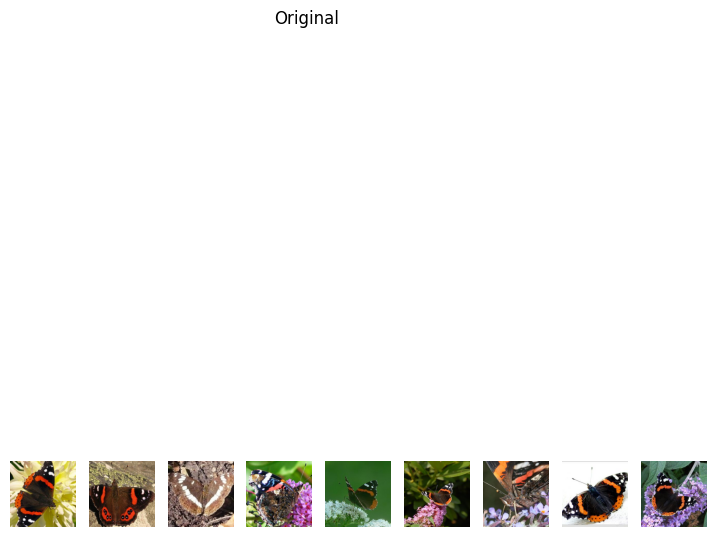

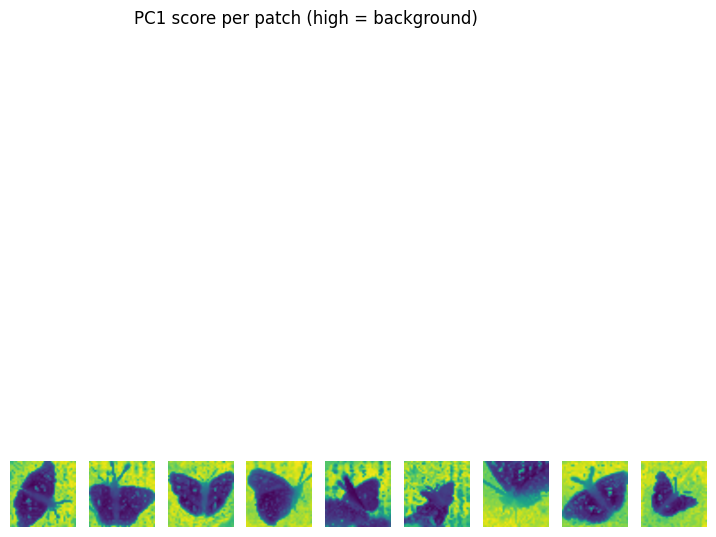

/tmp/ipykernel_1881/881454012.py:43: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  alpha_img = Image.fromarray(alpha, mode="L").resize(img.size, Image.NEAREST)


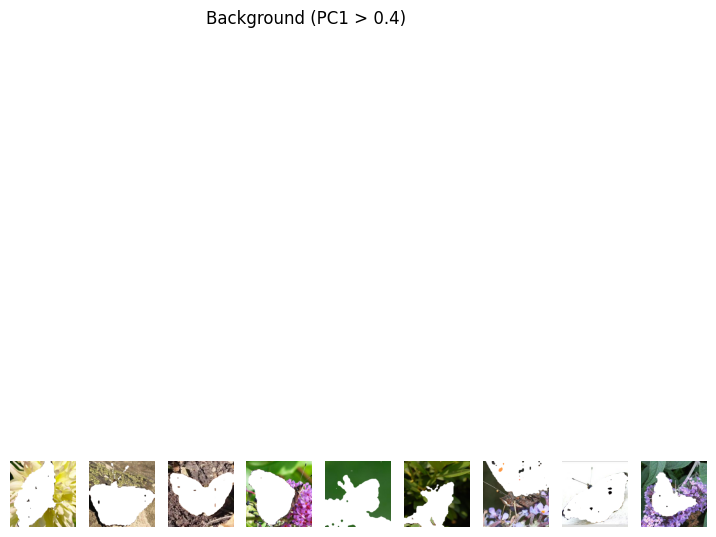

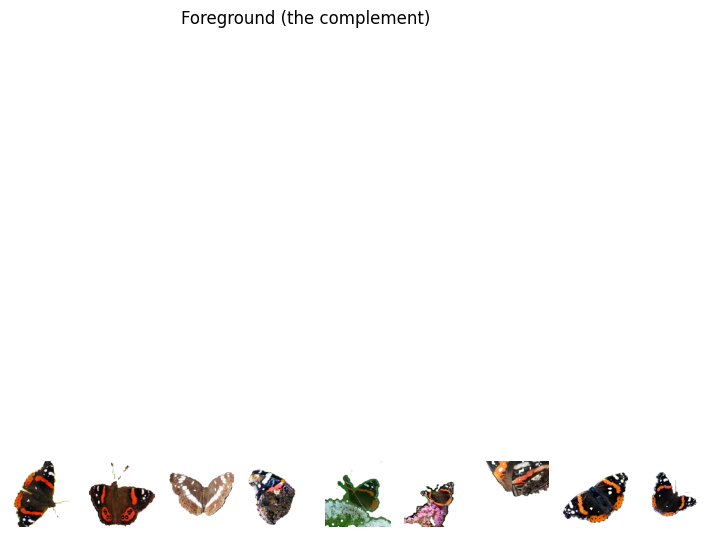

In [ ]:
features = features.cpu()
n_imgs, n_patches, n_embedding_size = features.shape
patch_h = patch_w = int(np.sqrt(n_patches))
img_size = patch_h * 14

processed_features = {
  'pca_features': [],
  'background': [],
  'bg_features': [],
  'features_foreground': []
}


def orient_pc1(pca_features: np.ndarray) -> np.ndarray:
    """Make 'high score == background' true for every image.

    The sign of a principal component is arbitrary, and pca_segment refits PCA (and the
    MinMaxScaler) per image -- so without this, the foreground lands above the threshold
    for some images and below it for others. Heuristic: the border of a photo is almost
    always background, so if the border scores low we flip the component.
    """
    m = pca_features[..., 0] if pca_features.ndim == 3 else pca_features
    border = np.concatenate([m[0, :], m[-1, :], m[:, 0], m[:, -1]])
    return 1.0 - pca_features if border.mean() < 0.5 else pca_features


for i in range(n_imgs):
  pca_features, _ = pca_segment(features[i], patch_h, patch_w, img_size, n_components=1)
  pca_features = orient_pc1(pca_features)   # <- deterministic orientation, see the note above

  # threshold background (now consistently the HIGH side for every image)
  threshold = 0.4
  background = pca_features > threshold

  processed_features['pca_features'].append(pca_features)
  processed_features['background'].append(background)


for i in range(1,n_imgs):
  plt.subplot(1, n_imgs, i+1)
  plt.imshow(original_imgs[i])
  plt.gcf().set_size_inches(10, 10)
  plt.axis('off')
plt.suptitle('Original')
plt.show()

for i in range(1,n_imgs):
    plt.subplot(1, n_imgs, i+1)
    patch_scores = processed_features['pca_features'][i]
    plt.imshow(patch_scores)
    # size image plot
    plt.gcf().set_size_inches(10, 10)
    plt.axis('off')
plt.suptitle('PC1 score per patch (high = background)')
plt.show()

for i in range(1,n_imgs):
  plt.subplot(1, n_imgs, i+1)
  img_mask = draw_segmentention_mask(original_imgs[i],  processed_features['background'][i])
  plt.gcf().set_size_inches(10, 10)
  plt.imshow(img_mask)
  plt.axis('off')
plt.suptitle('Background (PC1 > 0.4)')
plt.show()

for i in range(1,n_imgs):
  plt.subplot(1, n_imgs, i+1)
  img_mask = draw_segmentention_mask(original_imgs[i],  ~processed_features['background'][i])
  plt.gcf().set_size_inches(10, 10)
  plt.imshow(img_mask)
  plt.axis('off')
plt.suptitle('Foreground (the complement)')
plt.show()

## Segment using Dino & K-Means

Now we are using PCA with three components and comparing the results with **K-Means clustering** to group the extracted features.

> **Careful with the names.** K-Means is *unsupervised clustering*: it partitions the patch tokens into `k` groups with no labels involved. It is **not** k-NN (k-nearest-neighbours), which is a *supervised* classifier that needs labelled examples. Both show up around DINO — DINOv2 is commonly benchmarked with a k-NN protocol on top of frozen features — but what runs below is K-Means.

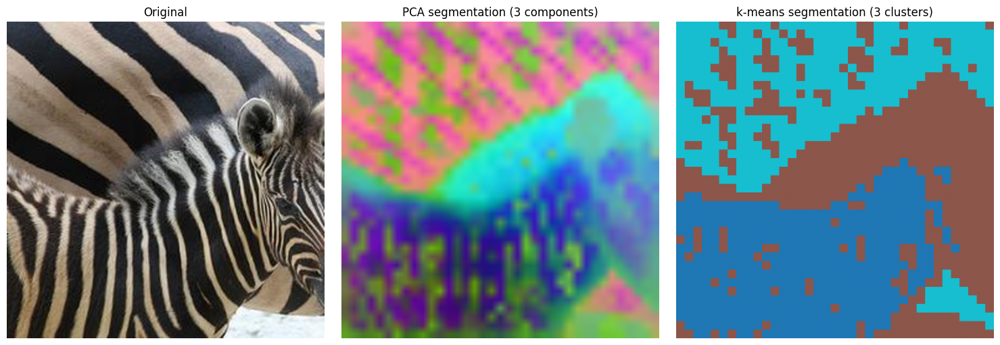

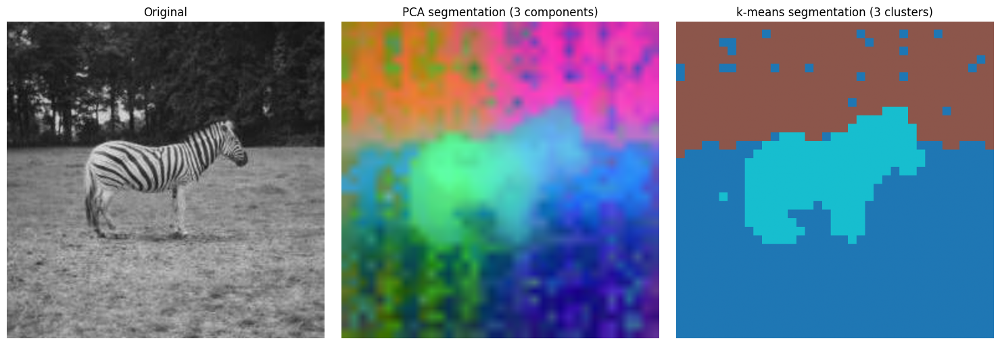

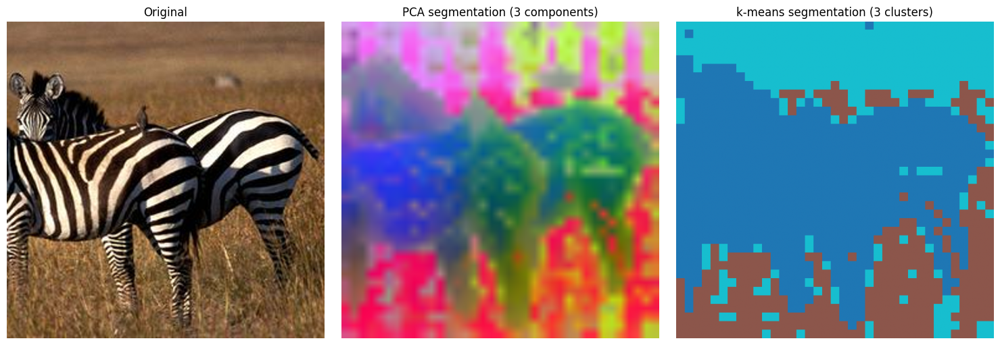

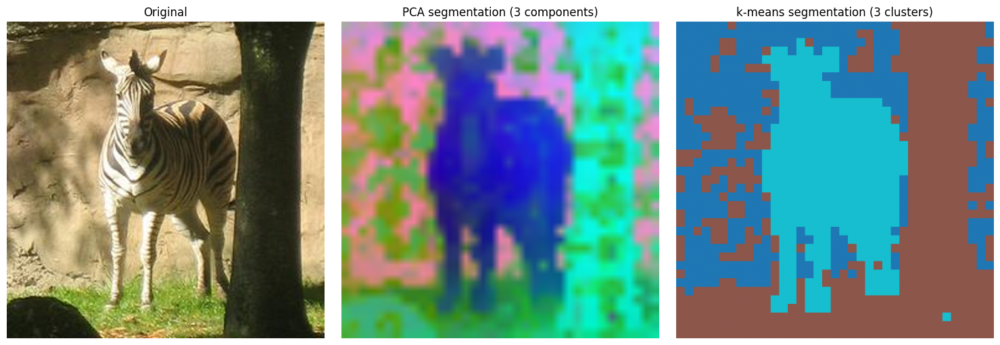

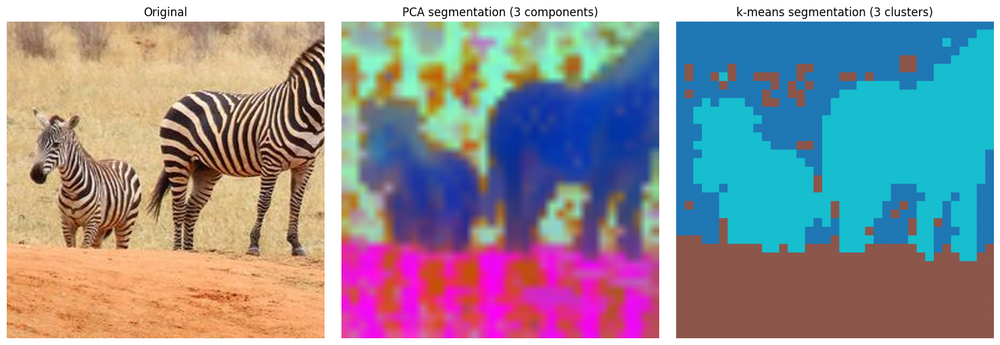

In [ ]:
import torch
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import requests


def get_patch_tokens(model, img_tensor: torch.Tensor) -> np.ndarray:
    """Returns patch token features [num_patches, embed_dim]."""
    img_tensor = img_tensor.to(device)
    with torch.no_grad():
        out = model.forward_features(img_tensor)
    # out["x_norm_patchtokens"] → [1, N, D]  (N = H/14 * W/14)
    tokens = out["x_norm_patchtokens"][0]   # [N, D]
    return tokens.cpu().numpy()

def kmeans_segment(tokens: np.ndarray, patch_h: int, patch_w: int,
                   img_size: int, n_clusters: int = 2) -> np.ndarray:
    """Cluster patch tokens → integer class map per pixel."""
    km = KMeans(n_clusters=n_clusters, n_init="auto", max_iter=1000)
    labels = km.fit_predict(tokens)              # [N]
    label_map = labels.reshape(patch_h, patch_w) # [ph, pw]

    # Upsample with nearest-neighbor (keeps crisp cluster boundaries)
    label_tensor = torch.tensor(label_map).unsqueeze(0).unsqueeze(0).float()
    label_up = F.interpolate(label_tensor, size=(img_size, img_size),
                             mode="nearest")
    return label_up[0, 0].numpy().astype(int)    # [H, W]

zebra_data_dir = './data/imagenet-256/zebra/'
MAX_IMGS = 5
zebra_img_paths = glob(os.path.join(zebra_data_dir, '*.jpg'))[:MAX_IMGS]

zebra_imgs = []
zebra_imgs_tensor = torch.zeros(MAX_IMGS, 3, 518, 518)

for i, img_path in enumerate(zebra_img_paths):
    img = Image.open(img_path)
    zebra_imgs.append(img)
    zebra_imgs_tensor[i] = preprocess(img)

for img in zebra_imgs:
    img_tensor = preprocess(img, img_size)

    patch_h = patch_w = img_size // 14   # 518//14 = 37
    tokens = get_patch_tokens(dinov2_backbone, img_tensor)  # [1369, 768]

    pca_map, components   = pca_segment(tokens, patch_h, patch_w, img_size, n_components=3)
    label_map = kmeans_segment(tokens, patch_h, patch_w, img_size, n_clusters=3)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(img.resize((img_size, img_size)))
    axes[0].set_title("Original")

    axes[1].imshow(pca_map)
    axes[1].set_title("PCA segmentation (3 components)")

    cmap = plt.get_cmap("tab10")
    axes[2].imshow(cmap(label_map / label_map.max()))
    axes[2].set_title("k-means segmentation (3 clusters)")

    for ax in axes:
        ax.axis("off")
    plt.tight_layout()
    plt.show()


<a id="4" />

# 4- Fintuning DinoV2

These utility functions are reused for DINOv2 and Swin classification:

- `train_one_epoch_cls`: computes training loss/accuracy.
- `eval_cls`: computes validation loss/accuracy.
- `plot_history`: plots metric curves over epochs.

### 4.1 Defining helper functions

In [ ]:
from datetime import datetime

# For academic purposes and due to hardware limitations we stop early. The limits live in
# section 1 (TRAIN_MAX_BATCHES / EVAL_MAX_SAMPLES) so they are visible where you look for them.

def train_one_epoch_cls(model, loader, criterion, optimizer, device, stop_at=TRAIN_MAX_BATCHES):
    model.train()
    total_loss, total_correct, total = 0.0, 0, 0
    total_batches = len(loader) if hasattr(loader, '__len__') else None

    for i, (x, y) in enumerate(loader):
        start_time = datetime.now()
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        logits = model(x)
        loss = criterion(logits, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * x.size(0)
        preds = logits.argmax(dim=1)
        total_correct += (preds == y).sum().item()
        total += x.size(0)
        end_time = datetime.now()
        delta = end_time - start_time
        delta = delta.total_seconds()
        if total_batches is not None:
            remaining = max(total_batches - (i + 1), 0)
            eta = (delta * remaining) / 60
            stop_earlier_remaining = None if stop_at is None else max(stop_at - (i + 1), 0)
            eta_stop_earlier = round((delta * stop_earlier_remaining) / 60, 2) if stop_earlier_remaining is not None else None
            print(f"Batch {i+1}/{total_batches} | Loss: {loss.item():.4f} | Accuracy: {total_correct/total:.4f} | Time: {delta:.2f} | ETA: {eta:.2f} mins | ETA (stop earlier): {eta_stop_earlier} mins ", end="\r")
        else:
            print(f"Batch {i+1} | Loss: {loss.item():.4f} | Accuracy: {total_correct/total:.4f} | Time: {delta:.2f}", end="\r")

        if stop_at is not None and i > stop_at:
            print(f"Stopping at {i} batches")
            break
    return total_loss / total, total_correct / total


def eval_cls(model, loader, criterion, device, stop_at=EVAL_MAX_SAMPLES):
    model.eval()
    total_loss, total_correct, total = 0.0, 0, 0

    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            logits = model(x)
            loss = criterion(logits, y)

            total_loss += loss.item() * x.size(0)
            preds = logits.argmax(dim=1)
            total_correct += (preds == y).sum().item()
            total += x.size(0)
            print(f"Validation with {total} samples, loss: {total_loss/total:.4f}, accuracy: {total_correct/total:.4f}", end="\r")
            if stop_at is not None and total > stop_at:
                print(f"Stopping at {total} samples")
                break
    return total_loss / total, total_correct / total


def plot_history(history, title='Training history'):
    epochs = range(1, len(history['train_loss']) + 1)
    fig, ax = plt.subplots(1, 2, figsize=(12, 4))

    ax[0].plot(epochs, history['train_loss'], label='train_loss')
    ax[0].plot(epochs, history['val_loss'], label='val_loss')
    ax[0].set_title('Loss')
    ax[0].set_xlabel('Epoch')
    ax[0].legend()

    ax[1].plot(epochs, history['train_acc'], label='train_acc')
    ax[1].plot(epochs, history['val_acc'], label='val_acc')
    ax[1].set_title('Accuracy')
    ax[1].set_xlabel('Epoch')
    ax[1].legend()

    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

### 4.2 Defining Head for our model

In [ ]:
# Train DINOv2 linear probe for a few epochs
EPOCHS = 2


dinov2_backbone = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')
dinov2_backbone = dinov2_backbone.to(device)
# Freeze backbone for linear probing (set False for full fine-tune)
for p in dinov2_backbone.parameters():
    p.requires_grad = False

with torch.no_grad():
    dummy = torch.randn(1, 3, 224, 224).to(device)
    feat_dim = dinov2_backbone(dummy).shape[-1]

class DinoLinearProbe(nn.Module):
    def __init__(self, backbone, in_dim, n_classes):
        super().__init__()
        self.backbone = backbone
        self.classifier = nn.Linear(in_dim, n_classes)

    def forward(self, x):
        feats = self.backbone(x)
        return self.classifier(feats)


dino_model = DinoLinearProbe(dinov2_backbone, feat_dim, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(dino_model.classifier.parameters(), lr=1e-3, weight_decay=1e-4)

print('DINOv2 feature dim:', feat_dim)



Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vits14/dinov2_vits14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vits14_pretrain.pth


100%|██████████| 84.2M/84.2M [00:00<00:00, 479MB/s]


DINOv2 feature dim: 384


### 4.3 Training and evaluating our model

In [ ]:

dino_history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

for epoch in range(EPOCHS):
    tr_loss, tr_acc = train_one_epoch_cls(dino_model, train_loader, criterion, optimizer, device)
    va_loss, va_acc = eval_cls(dino_model, val_loader, criterion, device)

    dino_history['train_loss'].append(tr_loss)
    dino_history['val_loss'].append(va_loss)
    dino_history['train_acc'].append(tr_acc)
    dino_history['val_acc'].append(va_acc)

    print(f'[DINOv2] Epoch {epoch+1}/{EPOCHS} | train_loss={tr_loss:.4f}, train_acc={tr_acc:.4f} | val_loss={va_loss:.4f}, val_acc={va_acc:.4f}')

Stopping at 1001 batches
Stopping at 304 samples
[DINOv2] Epoch 1/2 | train_loss=3.0278, train_acc=0.4538 | val_loss=1.7659, val_acc=0.5954
Stopping at 1001 batches
Stopping at 304 samples
[DINOv2] Epoch 2/2 | train_loss=1.8015, train_acc=0.6161 | val_loss=1.5854, val_acc=0.6382


## Summary of DINOv2 Fine-Tuning

For academic purposes, we fine-tune DINOv2 on an ImageNet-style dataset.

Due to hardware and time constraints, we train on a small subset of the data instead of the full dataset, and we stop each epoch early (`TRAIN_MAX_BATCHES`).

The model is learning: training accuracy increases over epochs and training loss decreases.

**How to read the train/val gap here.** With a frozen backbone, a freshly initialised linear head, 2 epochs and a truncated epoch, the honest statement is that *the head has not converged yet* — not that the model is overfitting. A linear probe on frozen features has very little capacity to overfit; that is the whole point of the protocol.

Note also that validation now uses `val_tfms` (deterministic resize + center crop), while training uses `RandomResizedCrop` + flip. This matters: if both splits shared the training augmentation, part of any gap you measured would just be the augmentation, and the validation number would change every time you re-ran the cell. **When you compare two numbers, make sure only one thing differs between them.**

To actually diagnose overfitting you would need: more epochs, an unfrozen backbone, and a validation curve that turns back upwards while the training curve keeps falling.

<a id="5" />

# 5- DinoV3

The architecture is largely the same — the differences are in **training recipe, scale, and a few key additions**.



---

## 5.0 Data

| | DINOv2 | DINOv3 |
|---|---|---|
| Dataset | LVD-142M (142M curated images) | LVD-1689M (1.69B images — ~12× larger) |
| Raw pool | ~1.2B unique web-crawled images | ~17B web images (public Instagram posts) |
| Curation | Self-supervised retrieval against curated seed datasets, PCA-hash dedup, NSFW filtering, face blurring | Hierarchical k-means over DINOv2 embeddings for balanced concept coverage, **plus** retrieval-curated images, **plus** public datasets (ImageNet-1k, ImageNet-22k, Mapillary Street-level Sequences) |

Both datasets are **images only** — there is no video or temporal supervision anywhere in DINOv3's pretraining.

The change in *curation strategy* is worth noting. DINOv2 curated mainly by retrieval (find web images that look like images from good datasets). DINOv3 keeps retrieval but leads with **hierarchical k-means clustering** over the raw pool, then samples evenly across clusters. Retrieval alone over-represents whatever the seed datasets already cover; clustering is what buys coverage of concepts nobody thought to seed.

This is the single biggest change between the two. More data at the same model size consistently beats architectural tricks.

---

## 5.1 Architecture additions in DINOv3

- **[Register tokens](https://arxiv.org/pdf/2309.16588)** — the DINOv2 release of April 2023 shipped without them. Registers came out of a follow-up paper by the same team and were then **backported to DINOv2** as the `*_reg` checkpoints (`dinov2_vits14_reg` … `dinov2_vitg14_reg` on Torch Hub, `facebook/dinov2-with-registers-*` on the Hub). DINOv3 builds them in from the start — 4 of them, which is why patch extraction uses `features[:, 5:, :]` (1 CLS + 4 registers) instead of `features[:, 1:, :]`.
This alone significantly improves dense task quality — and if registers are all you need, you can get them without leaving DINOv2 by swapping in a `*_reg` checkpoint.

- **SwiGLU FFN** — DINOv2 used standard GELU FFN. DINOv3 adopts SwiGLU.

- **RoPE (Rotary Positional Embeddings)** — DINOv2 used learned absolute position embeddings. DINOv3 switches to RoPE, improving generalization across resolutions.

- **New backbone: ConvNeXt** — DINOv2 was ViT-only. DINOv3 introduces a ConvNeXt variant trained with the same distillation objective, giving a more efficient option for dense tasks.



## 5.2 Register tokens

In DINOv3, **register tokens** are special learnable tokens added to the Vision Transformer (ViT) sequence alongside the standard patch tokens and CLS token. Their purpose is to act as dedicated:

<u>Memory Slots for Global Information</u>
---

Instead of forcing image patch tokens to carry both:

* Local spatial information
* Global semantic context

the model stores global/contextual information inside separate register tokens.

```text
[CLS] [REG1] [REG2] [REG3] [REG4] [PATCH1] [PATCH2] ... [PATCHN]
```

**Why Register Tokens Were Introduced**
---

In large Vision Transformers, researchers observed that some patch tokens developed:

* Extremely high activation norms
* Attention artifacts
* Unstable dense features

This happened because the transformer was implicitly using some patch tokens as temporary storage for global image information.
<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-reg-tokens.png" width=800>

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-highnorm.png" width=800>

That creates problems for dense tasks such as:

* Segmentation
* Depth estimation
* Correspondence matching
* Dense retrieval

because patch tokens should ideally represent **Local Spatial Features**
not global memory.

**Core Idea**
---

Register tokens provide dedicated latent memory locations where the transformer can store:

* Global scene context
* Semantic summaries
* Long-range relationships
* Intermediate internal representations

This prevents corruption of local patch embeddings.


*How They Work*
---

Register tokens participate in **Self-Attention** exactly like normal transformer tokens.

This means they can:

* Attend to patch tokens
* Exchange information with CLS
* Aggregate global context
* Store intermediate semantic information

During training, the model learns automatically:

* What information to place inside registers
* How to use them efficiently

No handcrafted behavior is defined.


---

## 5.3 Training objective

Both use the same core DINO + iBOT combination (self-distillation with masked image modeling), but DINOv3 adds:

- **KoLeo regularization** — pushes embeddings to be more uniformly spread across the representation space, improving retrieval
- **Gram anchoring** — a new loss term that stabilizes training at larger batch sizes / data scale



---
## 5.4 KoLeo regularization

**The problem it solves:**
---

 Without any regularization, learned embeddings tend to collapse into clusters — many images get mapped to nearly the same point in the embedding space, wasting capacity and hurting retrieval because unrelated images look similar.

KoLeo (from *Kolmogorov-Leonenko* entropy estimation) pushes embeddings to be **uniformly spread** across the hypersphere.

**The intuition:**
---

Imagine 1000 people standing in a field. KoLeo tells each person "find your nearest neighbor and maximize your distance to them." When everyone does this simultaneously, people spread out evenly — no crowding, no empty regions.


For each embedding `zᵢ`, find its nearest neighbor in the batch, take the distance, log it, and average.

Maximizing this (minimizing the negative) pushes every embedding away from its closest neighbor — forcing uniform coverage of the space.

**Why it matters for retrieval:**
---

 A uniformly distributed embedding space means the full 384/1280 dimensions are actually being used.

DINOv2 embeddings had some dimensions that were rarely activated — KoLeo fixes this, giving you better cosine similarity discrimination between images.


---

## 5.5 Gram anchoring

**The problem it solves:**
---

At very large batch sizes and data scales, DINO-style training becomes unstable. The student network can "drift" — its feature statistics (mean, variance, covariance) shift away from the teacher's in ways that don't improve the loss but destabilize training.

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-gram-ex.png" width=800>

**The intuition:**
---

The Gram matrix of a set of features captures their covariance structure — essentially "how do these dimensions relate to each other?" Gram anchoring says: *the student's covariance structure should match the teacher's*, as an explicit constraint.

It adds this as an auxiliary loss term that keeps the student's feature covariance anchored to the teacher's throughout training.

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-gram.png" width=800>

**Why it was needed specifically for DINOv3:**
---
 DINOv2 trained on 142M images with a self-supervised teacher. DINOv3 trains on 1.69B images with a fixed ViT-7B teacher — much longer training runs at much larger scale. Without Gram anchoring, the student's feature statistics drift over billions of steps, leading to training instability or collapse.


---
## 5.6 Positional encoding: RoPE

ViT has no notion of spatial order built in — self-attention treats tokens as a set, not a sequence.
You have to tell it where each patch lives.
- *Standard ViT*: learned absolute position embeddings — you add a fixed learnable vector to each patch before the first layer.
Works fine at the trained resolution, but degrades at other resolutions (the model has never seen positions 225, 226…).

- *RoPE (Rotary Position Embedding)*: Instead of adding a position vector, RoPE rotates the Q and K vectors by an angle proportional to position before computing attention:
```math
Attention score = (R_m · q)ᵀ (R_n · k)
                = qᵀ · R_{n-m} · k   
```

Where *R_m* is a rotation matrix for position m.

The dot product naturally encodes relative distance between tokens — the model learns "how far apart are these two patches" rather than "where exactly is this patch."

This makes it much better at generalizing to different image sizes and aspect ratios without retraining.

## How they work together

| | What it fixes | When it acts |
|---|---|---|
| KoLeo | Embedding space collapse | On student output embeddings |
| Gram anchoring | Training drift at scale | On student-teacher covariance alignment |

---

## Teacher model

DINOv2's teacher was its own largest model, **ViT-g/14 (1.1B parameters, 40 blocks)** — the smaller DINOv2 releases (ViT-L/14 at 303M, ViT-B/14 at 86M, ViT-S/14 at 21M) are all *distilled students* of that ViT-g.

DINOv3 distills from a **ViT-7B teacher** (6.7B parameters, embedding dim 4096, 32 heads) — a model trained separately at much larger scale. This is a significant change: the student (even ViT-S) is now learning from a fundamentally more powerful supervisor, and the jump in teacher capacity is roughly 1.1B → 6.7B.

---

## Summary

```text
DINOv3 = DINOv2
       + 12× more training data
       + register tokens          ← biggest quality boost for dense tasks
                                    (also available in DINOv2 via the *_reg checkpoints)
       + SwiGLU + RoPE            ← architecture modernization
       + ViT-7B teacher           ← 6.7B vs DINOv2's own 1.1B ViT-g
       + KoLeo + Gram anchoring   ← better training stability at scale
       + ConvNeXt variant         ← new efficient backbone option
```



## 5.7 DinoV3 - ConvNext feature maps

In [ ]:
import timm

model = timm.create_model(
    'convnext_large.dinov3_lvd1689m',
    pretrained=True,
    features_only=True,     # -> returns the list of per-stage feature maps, not a class logit
)
model = model.eval()

# Get the preprocessing this checkpoint was actually trained with (resolution, mean/std,
# interpolation). Hardcoding 224 + ImageNet stats is a common way to quietly lose accuracy.
data_config = timm.data.resolve_model_data_config(model)
print("model data config:", data_config)

# NOTE: do NOT name this `transforms` -- that would shadow `torchvision.transforms`, which
# cells 3, 13, 65 and 74 all rely on, and you would get a confusing TypeError if you ever
# jumped back to one of them.
timm_transforms = timm.data.create_transform(**data_config, is_training=False)

imgs = original_imgs[:5] + zebra_imgs[:5]
outputs = []
processed_imgs = []
with torch.no_grad():
    for i, img in enumerate(imgs):
        try:
            output = model(timm_transforms(img).unsqueeze(0))  # unsqueeze single image into batch of 1
            outputs.append(output)
            processed_imgs.append(img)
        except Exception as e:
            print(f"Error processing image {i}: {e}")

# `output` is the list of 4 stage tensors -- iterate over the list, not over output[0]
# (which would just walk the batch dimension of the first stage and print a single shape).
print(f"\nFeature maps per image ({len(outputs)} images processed):")
for stage_idx, o in enumerate(outputs[-1], start=1):
    print(f"  Stage {stage_idx}: {tuple(o.shape)}")

model.safetensors: reconstructing file:   0%|          |  0.00B /  785MB            

model.safetensors: downloading bytes:           |  0.00B            

model data config: {'input_size': (3, 224, 224), 'interpolation': 'bicubic', 'mean': (0.485, 0.456, 0.406), 'std': (0.229, 0.224, 0.225), 'crop_pct': 1.0, 'crop_mode': 'center'}

Feature maps per image (10 images processed):
  Stage 1: (1, 192, 56, 56)
  Stage 2: (1, 384, 28, 28)
  Stage 3: (1, 768, 14, 14)
  Stage 4: (1, 1536, 7, 7)


```text
B = batch size
C = channels/features
H,W = spatial resolution
```
| Stage   | Feature Map Shape  | Spatial Resolution | Channels | Main Information Learned            | Typical Usage                          |
| ------- | ------------------ | ------------------ | -------- | ----------------------------------- | -------------------------------------- |
| Stage 1 | `[1, 192, 56, 56]` | High               | 192      | Edges, textures, local patterns     | Low-level feature extraction           |
| Stage 2 | `[1, 384, 28, 28]` | Medium-High        | 384      | Shapes, contours, simple structures | Intermediate visual representation     |
| Stage 3 | `[1, 768, 14, 14]` | Medium-Low         | 768      | Object parts, semantic regions      | Dense feature extraction, segmentation |
| Stage 4 | `[1, 1536, 7, 7]`  | Low                | 1536     | High-level semantic concepts        | Embeddings, classification, retrieval  |


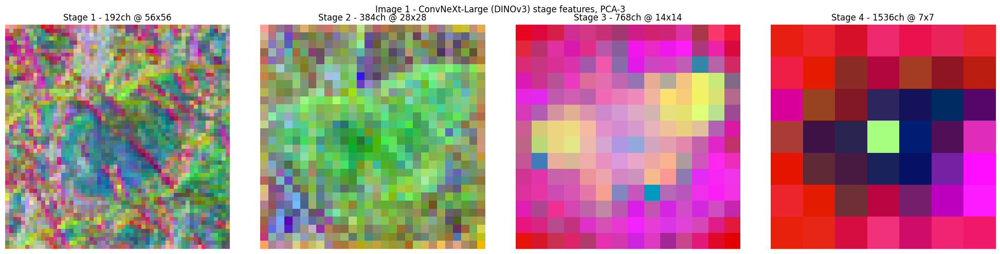

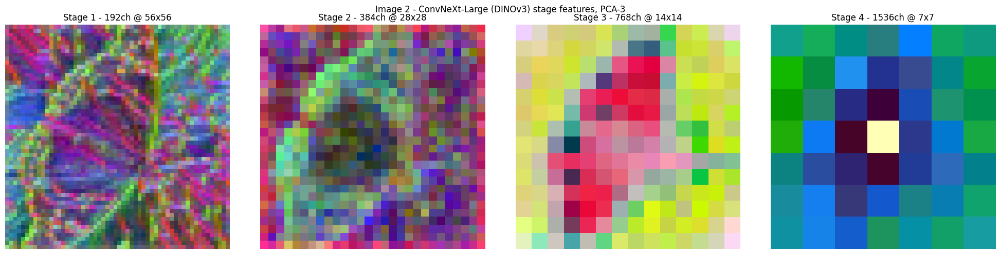

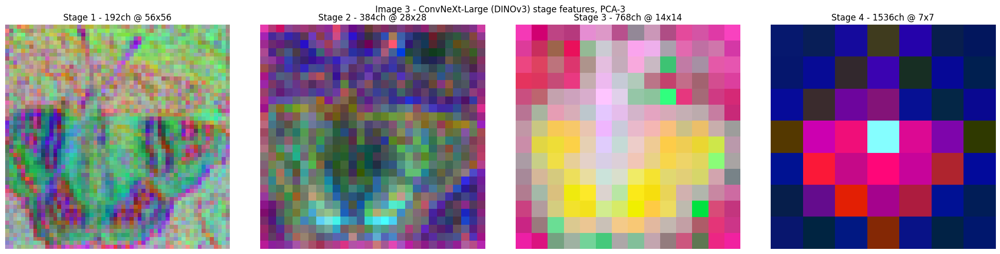

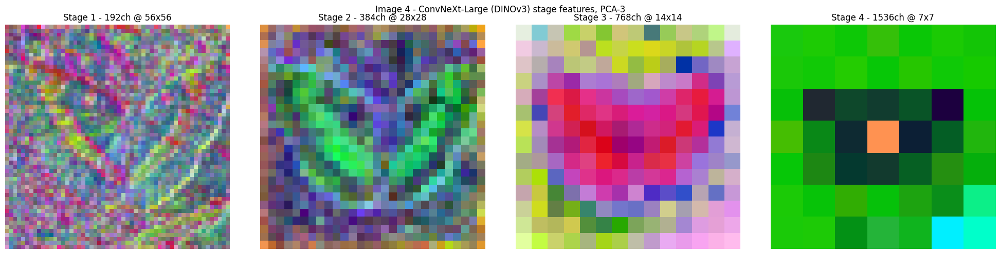

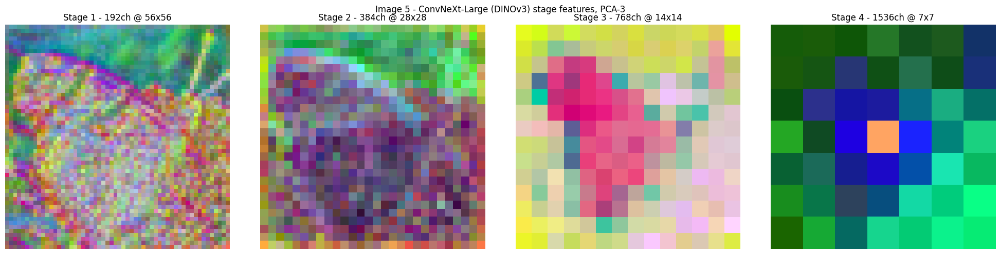

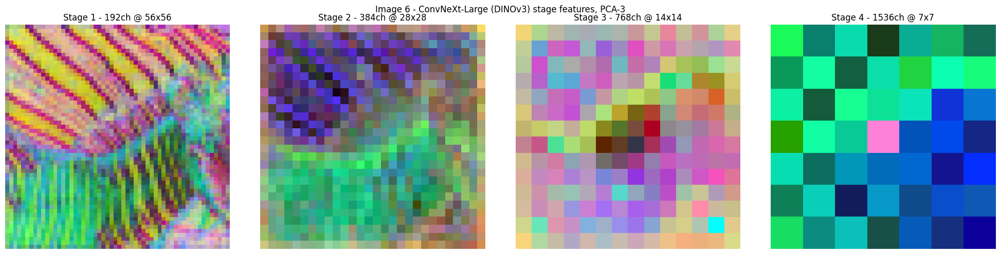

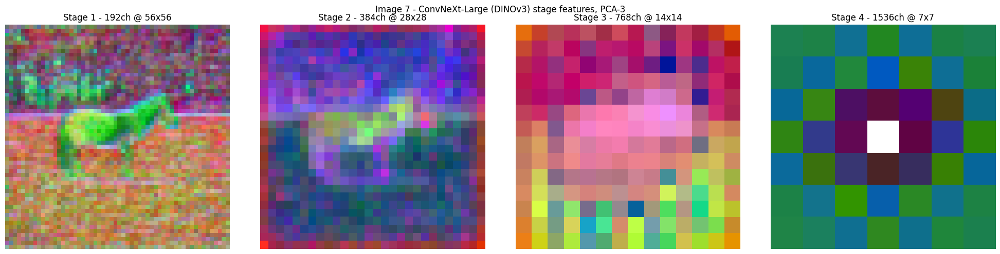

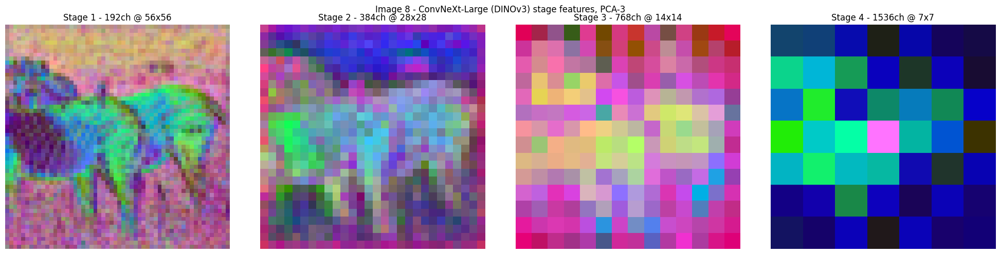

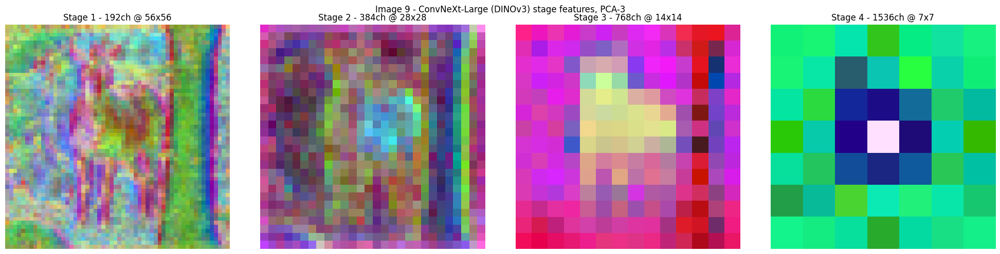

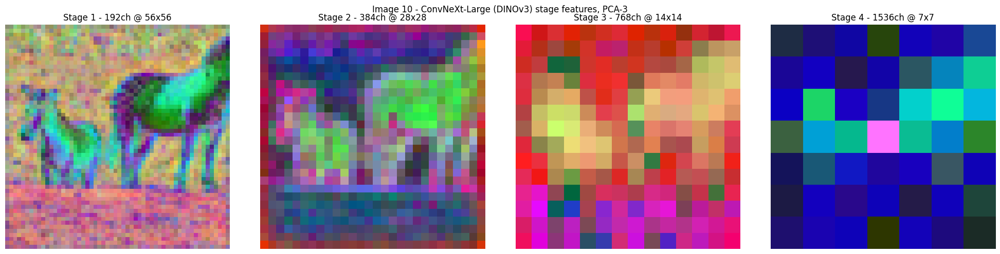

In [ ]:
scaler = MinMaxScaler()


for i, output in enumerate(outputs):
    fig, axs = plt.subplots(1, len(output), figsize=(20, 5))
    fig.suptitle(f"Image {i+1} - ConvNeXt-Large (DINOv3) stage features, PCA-3")

    for j, o in enumerate(output):
        # generating sub plot for each feature layer.
        # j is the STAGE index; i is the image index. Using i here would label all four
        # subplots identically and defeat the whole point of the table above.
        axs[j].set_title(f"Stage {j+1} - {o.shape[1]}ch @ {o.shape[2]}x{o.shape[3]}")
        axs[j].axis('off')

        feat = o.squeeze(0)

        n_channels, h, w = feat.shape
        feat = feat.permute(1, 2, 0)
        feat = feat.reshape(-1, n_channels)

        pca = PCA(n_components=3)
        feat_pca = pca.fit_transform(feat)
        norm_feat_pca = scaler.fit_transform(feat_pca)

        feat_pca = norm_feat_pca.reshape(h, w, 3)
        axs[j].imshow(feat_pca)

    plt.tight_layout()
    plt.show()


## 5.8 DinoV3 - Using Vit backbone

model.safetensors: reconstructing file:   0%|          |  0.00B / 86.4MB            

model.safetensors: downloading bytes:           |  0.00B            

checkpoint data config: {'input_size': (3, 256, 256), 'interpolation': 'bicubic', 'mean': (0.485, 0.456, 0.406), 'std': (0.229, 0.224, 0.225), 'crop_pct': 1.0, 'crop_mode': 'center'}
Explained variance ratio: [0.62260157 0.07418979 0.05053842]
Total explained: 74.7%


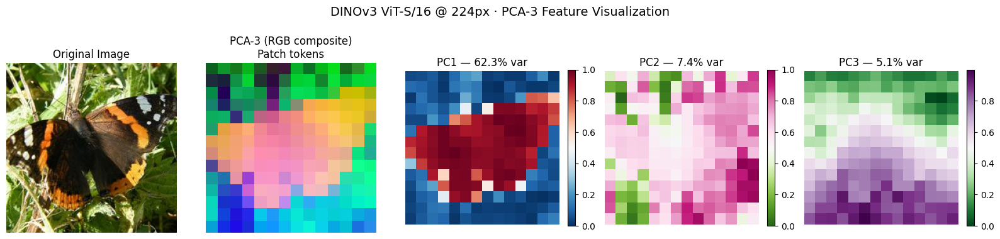

Explained variance ratio: [0.68932605 0.04911537 0.04788585]
Total explained: 78.6%


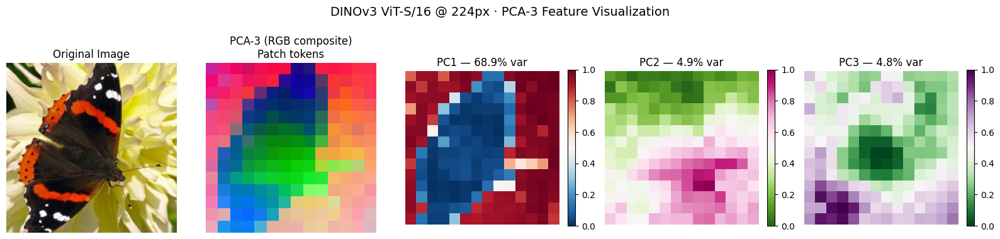

Explained variance ratio: [0.6335425  0.06755995 0.0498964 ]
Total explained: 75.1%


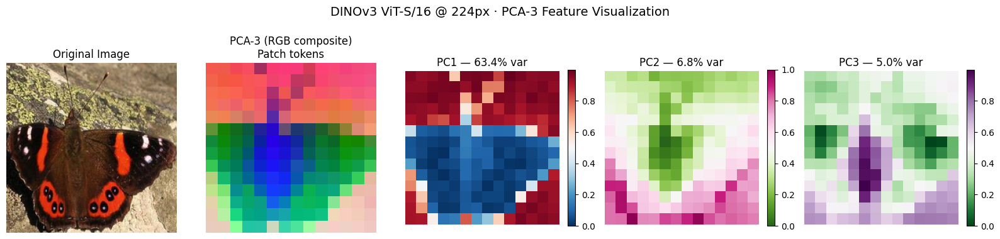

Explained variance ratio: [0.62972796 0.06738643 0.05094603]
Total explained: 74.8%


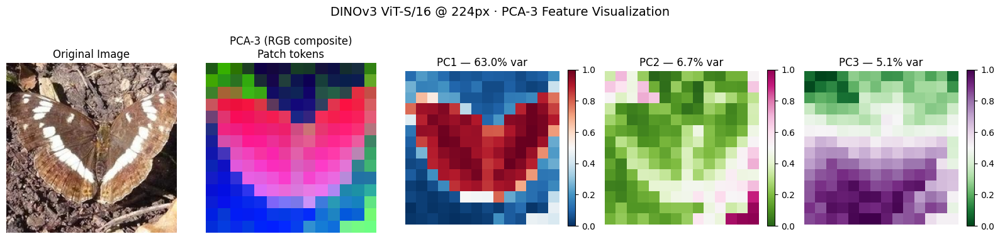

Explained variance ratio: [0.44315553 0.2097866  0.08107234]
Total explained: 73.4%


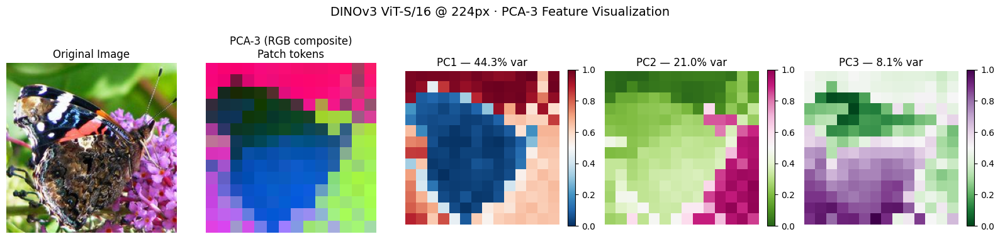

Explained variance ratio: [0.26990834 0.19789639 0.10558227]
Total explained: 57.3%


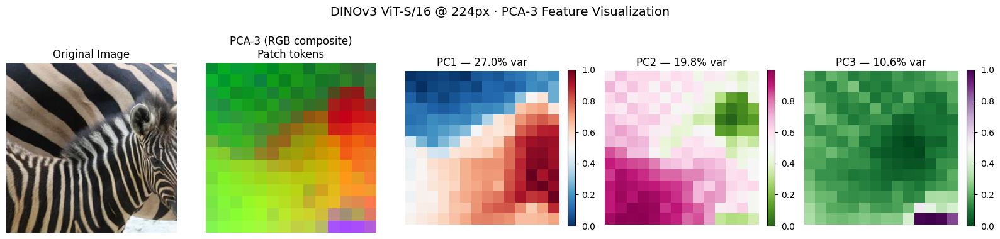

Explained variance ratio: [0.47943285 0.18974967 0.07442085]
Total explained: 74.4%


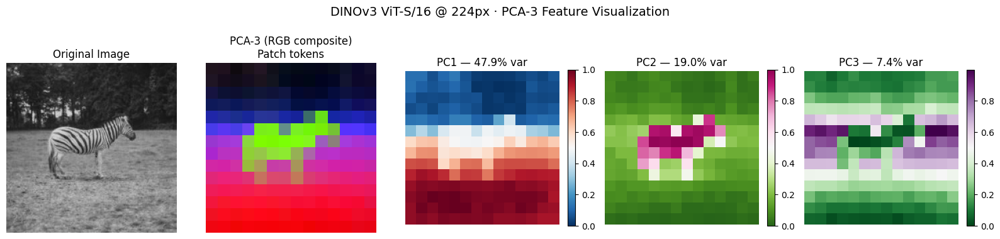

Explained variance ratio: [0.46609458 0.20377484 0.06571999]
Total explained: 73.6%


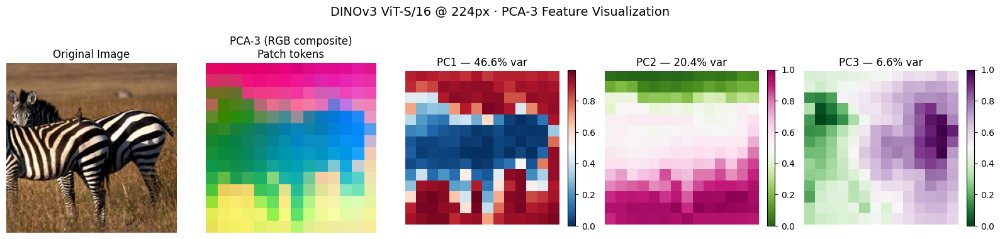

Explained variance ratio: [0.2901043  0.25037384 0.11560042]
Total explained: 65.6%


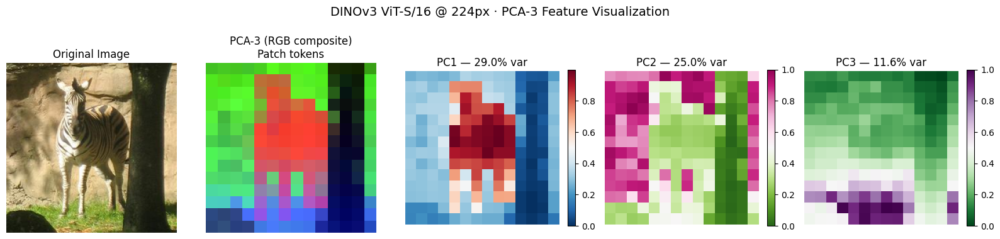

Explained variance ratio: [0.43853292 0.26287246 0.06079357]
Total explained: 76.2%


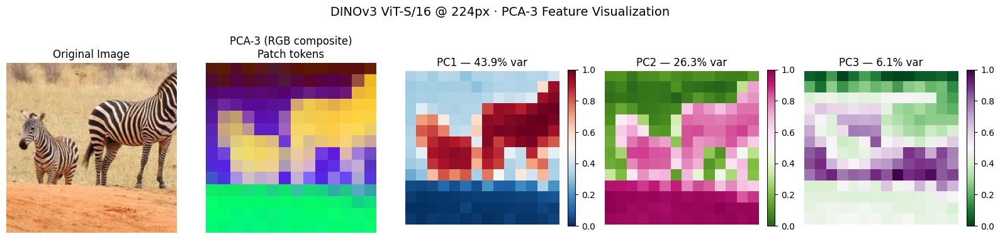

In [ ]:
import timm
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from PIL import Image
import requests
from torchvision import transforms

# ── 1. Model ─────────────────────────────────────────────────────────────────
# NOTE: this is ViT-S/16 (21.6M params), not the ViT-H+ (840M) from the comparison table
# in 5.9 -- same family, same 4 registers, same RoPE, but it fits in a free Colab session.
model = timm.create_model('vit_small_patch16_dinov3.lvd1689m', pretrained=True)
model.eval()

# ── 2. Image preprocessing ───────────────────────────────────────────────────
# Ask the checkpoint what it was trained with instead of hardcoding, exactly as in 5.7.
cfg = timm.data.resolve_model_data_config(model)
print("checkpoint data config:", cfg)

# This checkpoint is configured for 256x256. We deliberately run it at 224 to keep the
# patch arithmetic below simple -- and because we CAN: DINOv3 uses RoPE (section 5.6),
# so it generalises across resolutions instead of being locked to one learned position
# grid. That flexibility is one of the concrete payoffs of RoPE, so it is worth seeing.
IMG_SIZE = 224
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=cfg['mean'], std=cfg['std']),
])

rgb_imgs = [ img for img in imgs if img.mode == "RGB"]

for image in rgb_imgs:
    input_tensor = transform(image).unsqueeze(0)   # (1, 3, 224, 224)

    # ── 3. Extract patch tokens ───────────────────────────────────────────────────
    # forward_features returns ALL tokens: [CLS | 4 registers | 196 patches]
    # Shape: (B, 201, 384) for ViT-S/16
    with torch.inference_mode():
        features = model.forward_features(input_tensor)   # (1, 201, 384)

    num_registers = 4   # DINOv3 always uses 4 register tokens
    patch_tokens = features[:, 1 + num_registers:, :]    # (1, 196, 384)
    patch_tokens = patch_tokens.squeeze(0).numpy()        # (196, 384)

    # ── 4. PCA → 3 components ────────────────────────────────────────────────────
    pca = PCA(n_components=3)
    patch_pca = pca.fit_transform(patch_tokens)   # (196, 3)

    print(f"Explained variance ratio: {pca.explained_variance_ratio_}")
    print(f"Total explained: {pca.explained_variance_ratio_.sum():.1%}")

    # ── 5. Reshape & normalize → RGB image ───────────────────────────────────────
    patch_size   = 16
    h = w = IMG_SIZE // patch_size   # 224/16 = 14 × 14 grid (at 256 it would be 16 × 16)

    # Normalize each component independently to [0, 1]
    scaler = MinMaxScaler()
    patch_pca_norm = scaler.fit_transform(patch_pca)   # (196, 3) in [0,1]
    pca_image = patch_pca_norm.reshape(h, w, 3)         # (14, 14, 3)

    # ── 6. Visualize ─────────────────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 5, figsize=(16, 4))

    axes[0].imshow(image.resize((IMG_SIZE, IMG_SIZE)))
    axes[0].set_title("Original Image", fontsize=12)
    axes[0].axis("off")

    axes[1].imshow(pca_image)
    axes[1].set_title("PCA-3 (RGB composite)\nPatch tokens", fontsize=12)
    axes[1].axis("off")

    # Individual PCA components
    component_names = ["PC1", "PC2", "PC3"]
    cmaps = ["RdBu_r", "PiYG_r", "PRGn_r"]

    for i, (ax, name, cmap) in enumerate(zip(axes[2:], component_names[0:], cmaps[0:])):
        comp = patch_pca_norm[:, i].reshape(h, w)
        im = ax.imshow(comp, cmap=cmap)
        ax.set_title(f"{name} — {pca.explained_variance_ratio_[i]:.1%} var", fontsize=12)
        ax.axis("off")
        plt.colorbar(im, ax=ax, fraction=0.046)

    plt.suptitle(f"DINOv3 ViT-S/16 @ {IMG_SIZE}px · PCA-3 Feature Visualization", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig("dinov3_pca3.png", dpi=150, bbox_inches="tight")
    plt.show()


---

### What's happening at each step

**Token layout** — DINOv3's ViT-S/16 outputs 201 tokens per image:

```text
[CLS(1)]     [REG(4)]      [PATCH₁ … PATCH₁₉₆]
  skip ──────────────┘     ↑ we want these
```

The 196 patches cover a 14×14 spatial grid (224 ÷ 16 = 14).

That count follows `IMG_SIZE`, it is not a property of the model: at the checkpoint's native 256px you would get 16×16 = 256 patches and 261 tokens. RoPE is what lets the same weights serve both — a learned absolute position embedding would have to be interpolated.

**PCA projection**

| Component | Captures | Maps to |
|-----------|----------|---------|
| PC1 | Foreground vs. background separation | R |
| PC2 | Object part boundaries | G |
| PC3 | Texture / fine detail variation | B |

**Tip — foreground masking before PCA**: a common refinement is to first threshold PC1 to isolate foreground patches, then re-run PCA only on those patches. This gives much cleaner part segmentation:




---

## 5.9 DinoV3 Backbone - Architecture Comparison

---
## Training
Both models are part of the same DINOv3 family and share the same training data (LVD-1689M) and distillation teacher (ViT-7B), but they differ fundamentally in **architecture, size, and use-case tradeoffs**.

The ConvNeXt follows the same distillation procedure but adapts it to convolutional receptive fields.

| | `dinov3-vith16plus` | `dinov3-convnext-large` | `vit_small_patch16_dinov3` |
|---|---|---|---|
| **Backbone** | Vision Transformer (ViT) | ConvNeXt (pure CNN) | Vision Transformer (ViT) |
| **Variant** | ViT-H+/16 | ConvNeXt-Large | ViT-S/16 |
| **Parameters** | ~840M | ~196M | ~22M |
| **Patch/Stride** | Patch size 16 (tokenized) | Hierarchical convolutional stages |
| **Embedding dim** | 1280 | — (hierarchical feature maps) |
| **Attention heads** | 20 | N/A |
| **FFN type** | SwiGLU | Standard ConvNeXt blocks |
| **Positional encoding** | RoPE (Rotary Position Embedding )| Implicit via convolutions |
| **Register tokens** | 4 | N/A |
| **Output** | CLS token + patch tokens + register tokens | Hierarchical feature maps |

---

## Key Practical Differences

| Aspect | ViT-H+ | ConvNeXt-Large |
|--------|--------|----------------|
| **Inductive biases** | Weak (learns everything via attention) | Strong (locality, translation equivariance) |
| **Input resolution** | Fixed multiples of 16 | Natively flexible (fully convolutional) |
| **High-res inference** | Requires careful tiling | Handles arbitrary resolutions natively |
| **Memory/compute** | Heavy (840M, quadratic attention) | Much lighter (198M, linear conv cost) |
| **Dense prediction** | Patch tokens → linear head | Hierarchical feature maps → FPN-friendly |
| **Retrieval/embedding** | CLS token is strong out-of-the-box | Less natural for global embedding tasks |
| **FPN compatibility** | Needs adapter (e.g. ViTDet-style) | Naturally compatible — multi-scale outputs |

---

## When to Choose Each

**Use `ViT-H+`** when:
- You need **maximum accuracy** on global tasks (retrieval, classification, keypoint matching)
- You're doing **semantic correspondence** (SPair-71k) or **video segmentation** (DAVIS)
- Compute is not a bottleneck and you're working at 224px

**Use `ConvNeXt-Large`** when:
- You need **efficient inference** at **high or variable resolutions** (512px+)
- You're building a **detection/segmentation pipeline** with an FPN neck — ConvNeXt slots directly in
- You want a **4× smaller model** with still very competitive dense task performance
- Deploying on resource-constrained environments (edge, real-time pipelines)

---

**Bottom line:** ViT-H+ is your best feature extractor for accuracy-critical tasks. ConvNeXt-Large is the pragmatic backbone choice when you need native multi-scale features, flexible resolutions, and lower compute.

---

> **What the hands-on above actually ran.** Section 5.7 used `convnext_large.dinov3_lvd1689m` (the middle column, ~196M) and section 5.8 used `vit_small_patch16_dinov3.lvd1689m` — **ViT-S/16, ~22M parameters**, the third column, not the ViT-H+ this table opens with. They are ~40× apart in size. Everything structural is shared (4 register tokens, RoPE, SwiGLU, the same ViT-7B teacher and the same LVD-1689M data), so the feature visualisations teach the same lesson — but do not read the ViT-H+ accuracy claims as describing what you just ran. If you have the VRAM, swap the model id in 5.8 and compare the PCA maps.

<a id="6" />

# 6- Swin transformer

## 6.1 Introduction

The **Swin Transformer** (Shifted Window Transformer) is a hierarchical Vision Transformer architecture proposed by researchers from Microsoft in 2021.

Paper: *“Swin Transformer: Hierarchical Vision Transformer using Shifted Windows”*

It was designed to overcome some important limitations of the original Vision Transformer (**ViT**), especially regarding:

* Computational cost on high-resolution images
* Lack of hierarchical feature maps
* Poor scalability for dense vision tasks

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/swin-2.png" width=800>

Swin Transformer combines ideas from:

* **CNNs**

  * hierarchical representations
  * locality
  * multi-scale processing

with:

* **Transformers**

  * self-attention
  * long-range dependencies

---

# Why Was Swin Transformer Needed?

The original Vision Transformer processes an image as a sequence of patches using **global self-attention**.

Global attention has complexity:

O(N^2)

Where:

* (N) = number of image patches

This becomes extremely expensive for:

* high-resolution images
* object detection
* segmentation
* video processing

Additionally, ViT produces only a **single-scale representation**, unlike CNNs that naturally generate feature pyramids.

Swin Transformer solves these problems.



---

## 6.2 Main Ideas Behind Swin Transformer

The architecture introduces several important concepts:

| Concept                | Purpose                           |
| ---------------------- | --------------------------------- |
| Patch Partitioning     | Split image into small patches    |
| Hierarchical Stages    | Multi-scale feature extraction    |
| Window-based Attention | Reduce computation                |
| Shifted Windows        | Enable cross-window communication |
| Patch Merging          | Downsample features progressively |

   |


---

## 6.3 High-Level Architecture

Input image:

```text
Image → Patch Partition → Linear Embedding
       → Swin Stage 1
       → Patch Merging
       → Swin Stage 2
       → Patch Merging
       → Swin Stage 3
       → Patch Merging
       → Swin Stage 4
       → Head
```

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/swin-1.png" width=600>

The design is hierarchical, very similar to a CNN backbone like:

* ResNet
* ConvNeXt
* EfficientNet

This makes Swin suitable for:

* classification
* object detection
* segmentation
* tracking
* video understanding


## Normal Window Partition

```text
+----+----+
| W1 | W2 |
+----+----+
| W3 | W4 |
+----+----+
```

Attention occurs only inside each window.




---

### 6.3.1 Step 1 — Patch Partition

The image is divided into non-overlapping patches.

Example:

```text
224 × 224 image
↓
4 × 4 patches
↓
56 × 56 tokens
```

Each patch is flattened and projected into an embedding vector.

Similar to ViT.



---

### 6.3.2 Step 2 — Window-Based Self-Attention (W-MSA)

Instead of computing attention globally across all tokens, Swin computes self-attention **inside local windows only**.

Example:

```text
56 × 56 feature map
↓
partition into windows OF 7 × 7 patches
↓
(56 / 7) × (56 / 7) = 8 × 8 = 64 windows
↓
attention inside each window (49 tokens each)
```

Read that carefully: **M = 7 is the window *size* in patches, not the number of windows.** Each window holds 7 × 7 = 49 tokens, and there are 64 of them. This is what makes the complexity formula below legible — attention cost is 49² per window × 64 windows, which grows *linearly* in the number of patches, instead of 3136² once, globally.

This drastically reduces complexity.

---

## Complexity Comparison

### Global Attention (ViT)

O(N^2)

### Window Attention (Swin)

O(M^2N)

Where:

* (N) = total patches
* (M) = window size

Since (M) is fixed and small:

```text
Complexity becomes nearly linear
```

This is one of the biggest advantages of Swin.

---

# Problem With Fixed Windows

If attention is computed only inside windows:

```text
tokens cannot communicate across windows
```

This limits global understanding.




### 6.3.3 Step 3 — Shifted Window Mechanism

Swin solves this with the **Shifted Window** technique.



---

## 6.4 Shifted Window Partition

Next transformer block shifts the windows:

```text
  +----+----+
  | W1 | W2 |
+----+----+
| W3 | W4 |
+----+
```

Now tokens interact with neighboring windows.

This enables:

* cross-window communication
* larger receptive field
* better contextual understanding

without expensive global attention.


---

## 6.5 Swin Transformer Block

Each block contains:

| Component                        | Description              |
| -------------------------------- | ------------------------ |
| LayerNorm                        | Normalization            |
| Window Multi-Head Self-Attention | Local attention          |
| Shifted Window Attention         | Cross-window interaction |
| MLP                              | Feed-forward network     |
| Residual Connections             | Stable training          |

  

---

## 6.6 Hierarchical Representation

Unlike ViT, Swin progressively downsamples feature maps.

Example:

| Stage   | Resolution | Channels |
| ------- | ---------- | -------- |
| Stage 1 | 56×56      | 96       |
| Stage 2 | 28×28      | 192      |
| Stage 3 | 14×14      | 384      |
| Stage 4 | 7×7        | 768      |

This is very similar to CNN feature pyramids.

Important for:

* detection
* segmentation
* dense prediction tasks



---

## 6.7 Patch Merging

Patch merging acts similarly to pooling/downsampling in CNNs.

It:

* merges neighboring patches
* reduces spatial resolution
* increases channel dimension

Example:

```text
56×56×96
↓
28×28×192
```



---

## 6.8 Comparison: Swin vs ViT vs CNNs

| Feature                   | CNN       | ViT                 | Swin Transformer |
| ------------------------- | --------- | ------------------- | ---------------- |
| Locality Bias             | Strong    | Weak                | Moderate         |
| Global Context            | Limited   | Excellent           | Good             |
| Hierarchical Features     | Yes       | No                  | Yes              |
| Multi-Scale Features      | Yes       | No                  | Yes              |
| Computational Efficiency  | High      | Low on large images | High             |
| Suitable for Detection    | Excellent | Moderate            | Excellent        |
| Suitable for Segmentation | Excellent | Moderate            | Excellent        |
| Attention Mechanism       | No        | Global              | Local + Shifted  |
| Complexity                | Linear    | Quadratic           | Near Linear      |



---

## 6.9 Advantages of Swin Transformer

| Advantage                    | Explanation                         |
| ---------------------------- | ----------------------------------- |
| Efficient on High Resolution | Local windows reduce computation    |
| Hierarchical Architecture    | Similar to CNN feature pyramids     |
| Scalable                     | Works well on large images          |
| Strong Accuracy              | Was state of the art on ImageNet / COCO / ADE20K at publication (2021); still a competitive general-purpose backbone |
| Flexible Backbone            | Can replace CNN backbones           |
| Better for Dense Tasks       | Detection and segmentation friendly |
| Cross-Window Interaction     | Shifted windows improve context     |



---

## 6.10 Disadvantages

| Limitation                  | Explanation                          |
| --------------------------- | ------------------------------------ |
| More Complex Than CNNs      | Harder implementation                |
| Still Computationally Heavy | More expensive than lightweight CNNs |
| Memory Intensive            | Especially large variants            |
| Training Cost               | Requires substantial compute         |



---

## 6.11 Variants of Swin Transformer

| Model  | Description                             |
| ------ | --------------------------------------- |
| Swin-T | Tiny                                    |
| Swin-S | Small                                   |
| Swin-B | Base                                    |
| Swin-L | Large                                   |
| SwinV2 | Improved training stability and scaling |



---

## 6.12 Applications

Swin Transformer is widely used in:

| Task                  | Usage                           |
| --------------------- | ------------------------------- |
| Image Classification  | ImageNet                        |
| Object Detection      | Faster R-CNN, Mask R-CNN        |
| Semantic Segmentation | UPerNet, Mask2Former             |
| Face Recognition      | Transformer backbones           |
| Video Understanding   | Video Swin Transformer          |
| Medical Imaging       | MRI / CT analysis               |
| Autonomous Driving    | Perception systems              |



---

## 6.13 Swin Transformer vs ConvNeXt

ConvNeXt was partially inspired by Swin.

| Feature               | Swin      | ConvNeXt    |
| --------------------- | --------- | ----------- |
| Core Operation        | Attention | Convolution |
| Global Modeling       | Better    | Limited     |
| Efficiency            | Good      | Very Good   |
| Simplicity            | Lower     | Higher      |
| Hardware Optimization | Moderate  | Excellent   |
| Training Complexity   | Higher    | Lower       |

---

### Where Swin sits today

Swin is in this course because it is the architecture that made hierarchical attention practical — it is the bridge between the CNN backbones of class 2 and the ViTs of class 4, and nearly every dense-prediction transformer since borrows from it.

That is a different claim from "use Swin for your project". For a new project today, the DINOv3 backbones from section 5 are usually the stronger starting point: they are self-supervised (no ImageNet labels needed), they ship frozen features that transfer without fine-tuning, and the ConvNeXt variant gives you the same FPN-friendly multi-scale outputs that make Swin attractive in the first place.

Learn Swin for the ideas — windowed attention, shifting, patch merging. Reach for DINOv3 when you need a backbone.  

## 6.14 Finetunning  example (ImageNet classification)

Swin Transformer is a hierarchical transformer with shifted windows. Here we:

1. Load pretrained `swin_t`.
2. Replace classification head for ImageNet-style classes.
3. Train for a few epochs and plot loss/accuracy.

Downloading: "https://download.pytorch.org/models/swin_t-704ceda3.pth" to /root/.cache/torch/hub/checkpoints/swin_t-704ceda3.pth


100%|██████████| 108M/108M [00:00<00:00, 238MB/s] 


Stopping at 1001 batches
Stopping at 304 samples
[Swin] Epoch 1/3 | train_loss=4.5547, train_acc=0.2568 | val_loss=2.1142, val_acc=0.5033
Stopping at 1001 batches
Stopping at 304 samples
[Swin] Epoch 2/3 | train_loss=2.4080, train_acc=0.5110 | val_loss=1.2634, val_acc=0.6875
Stopping at 1001 batches
Stopping at 304 samples
[Swin] Epoch 3/3 | train_loss=2.0788, train_acc=0.5603 | val_loss=1.3854, val_acc=0.6414


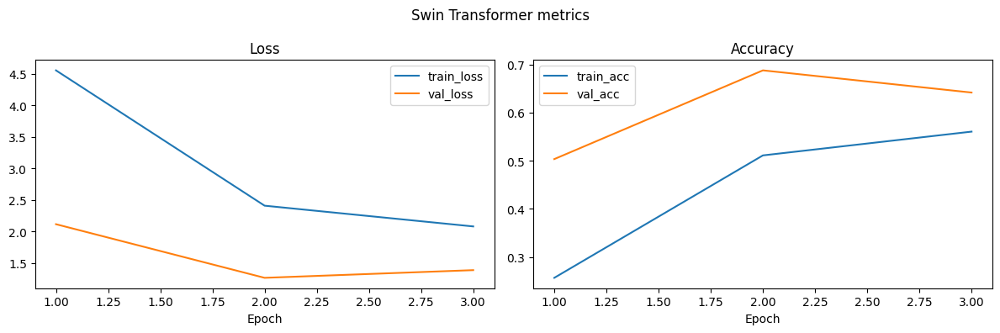

In [ ]:
# Swin Transformer fine-tuning on the same ImageNet-style subset
weights = Swin_T_Weights.IMAGENET1K_V1
swin_model = swin_t(weights=weights)

# Replace head for your target classes
in_features = swin_model.head.in_features
swin_model.head = nn.Linear(in_features, num_classes)
swin_model = swin_model.to(device)

swin_criterion = nn.CrossEntropyLoss()
swin_optimizer = optim.AdamW(swin_model.parameters(), lr=1e-4, weight_decay=5e-2)

SWIN_EPOCHS = 3
swin_history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

for epoch in range(SWIN_EPOCHS):
    tr_loss, tr_acc = train_one_epoch_cls(swin_model, train_loader, swin_criterion, swin_optimizer, device)
    va_loss, va_acc = eval_cls(swin_model, val_loader, swin_criterion, device)

    swin_history['train_loss'].append(tr_loss)
    swin_history['val_loss'].append(va_loss)
    swin_history['train_acc'].append(tr_acc)
    swin_history['val_acc'].append(va_acc)

    print(f'[Swin] Epoch {epoch+1}/{SWIN_EPOCHS} | train_loss={tr_loss:.4f}, train_acc={tr_acc:.4f} | val_loss={va_loss:.4f}, val_acc={va_acc:.4f}')

plot_history(swin_history, title='Swin Transformer metrics')

<a id="7" />

# 7- DETR for Panoptic Segmentation
DETR (DEtection TRansformer) extended its original object detection design to handle panoptic segmentation — the unified task of segmenting every pixel in an image, assigning both thing labels (countable objects: cars, people) and stuff labels (amorphous regions: sky, road, grass).



## 7.1 The core idea: detection as **set prediction**

Before the architecture diagram, the idea — because DETR's whole design follows from it, and none of it is visible in the API calls further down.

### The problem with the detectors that came before

Faster R-CNN, YOLO and SSD all predict *many* overlapping boxes and then clean up afterwards with **Non-Maximum Suppression (NMS)**: sort by confidence, keep the best box, delete everything overlapping it, repeat. NMS works, but it is a hand-written post-processing step with its own threshold to tune, it is not differentiable, and it cannot be learned. Detection was never really end-to-end.

DETR's claim: **predict the set of objects directly, and there is nothing to suppress.**

### 1. Object queries — 100 slots

The decoder takes **N = 100 learned embeddings** called *object queries* (the number is fixed and is a hyper-parameter; 100 is DETR's default, comfortably above the ~7 objects in a typical COCO image).

Each query is a slot that attends over the image features and answers: *"is there an object for me, and if so, what class and what box?"* The queries are learned during training and are the same 100 vectors for every image — through training they specialise, e.g. one drifts towards small objects on the left, another towards large central ones.

```text
100 object queries  ──decoder──▶  100 × (class distribution, box)
                                  most of them say "∅ / no object"
```

### 2. The ∅ ("no object") class

An image with 7 objects still produces 100 predictions. The other 93 must say *nothing here* — so the classifier has **91 COCO classes + 1 extra class ∅**, and the ground truth is padded with ∅ up to 100.

This is the class that gets dropped in section 8.3 with the slice `[..., :-1]`. It always sits last.

### 3. Bipartite matching — the Hungarian algorithm

Here is the training problem. The model outputs 100 predictions **as a set** — in no particular order. The ground truth has 7 boxes, also in no particular order. Which prediction should be scored against which box?

Answer: find the **one-to-one assignment that minimises total cost** over the whole image, using the *Hungarian algorithm*. Cost per (prediction, ground-truth) pair combines class probability and box error (L1 + generalised IoU):

```text
        gt_1   gt_2   gt_3        ← 3 real objects
pred_1  [ 0.9   4.2   3.7 ]
pred_2  [ 3.1   0.4   2.9 ]       cost matrix (lower = better fit)
pred_3  [ 2.8   3.3   1.1 ]
  ...        ...                  ← the other 97 get matched to ∅
```

The optimal assignment here is `pred_1→gt_1`, `pred_2→gt_2`, `pred_3→gt_3`. Every other query is trained towards ∅.

**Why this removes NMS:** the matching is one-to-one *by construction*. Exactly one query is rewarded for each real object, and every other query is actively pushed to say ∅. Duplicates are not filtered out after the fact — they are penalised during training, so the model learns not to produce them.

### 4. The set prediction loss

Once the matching is fixed, the loss is ordinary: cross-entropy on the class (including ∅) plus L1 + GIoU on the boxes of matched pairs. The Hungarian step just decides *which* prediction each term applies to. It runs inside the training loop and is not differentiated through.

### What it costs

This design is elegant, but it converges very slowly — the original DETR needed **~500 epochs** on COCO, where Faster R-CNN needs ~12. Each query has to search the whole image through global attention, and the matching is unstable early in training (a query may match a different object each step). Section 7.4 covers what the follow-up work did about it.

> **Note on the name.** One of those follow-ups is itself called **DINO** ([DETR with Improved deNoising anchOr boxes](https://arxiv.org/abs/2203.03605)) and has *nothing* to do with the self-supervised DINO of section 2. Unfortunate collision, same year, both from vision — just be aware of it when reading papers.

## 7.2 Architecture Overview
The panoptic DETR pipeline stacks four major stages:

- CNN Backbone — extracts multi-scale feature maps
- Transformer Encoder-Decoder — attends over image features to produce N object queries
- Mask Head — generates per-query binary masks using multi-resolution attention maps
- Panoptic Fusion — merges thing and stuff predictions into a single coherent pixel labeling

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/detr_panoptic_architecture.svg" width=600>

## 7.3 How panoptic segmentation is scored: **Panoptic Quality (PQ)**

Detection uses mAP and semantic segmentation uses mIoU, but panoptic segmentation needs a metric that handles *both* countable things and amorphous stuff in one number. That metric is **PQ**.

A predicted segment and a ground-truth segment are declared a **match** when their IoU is **> 0.5**. That threshold is special: above 0.5, the matching is provably unique — one prediction cannot match two ground-truth segments — so no NMS-like tie-breaking is needed. Every segment then falls into one of three buckets:

| Bucket | Meaning |
|---|---|
| **TP** | matched pair (IoU > 0.5) |
| **FP** | predicted segment with no match |
| **FN** | ground-truth segment with no match |

$$PQ = \underbrace{\frac{\sum_{(p,g) \in TP} IoU(p,g)}{|TP|}}_{\text{SQ — segmentation quality}} \times \underbrace{\frac{|TP|}{|TP| + \frac{1}{2}|FP| + \frac{1}{2}|FN|}}_{\text{RQ — recognition quality}}$$

The factorisation is the useful part:

- **SQ** — *when you found the object, how well did you outline it?* Average IoU over matches only.
- **RQ** — *did you find the right objects at all?* This is exactly the F1 score over segments.

A model with `PQ = 0.4` that splits as `SQ = 0.8, RQ = 0.5` has a very different problem from one at `SQ = 0.5, RQ = 0.8`: the first draws good masks but misses/hallucinates whole objects; the second finds everything but outlines it sloppily. PQ is reported per-class and averaged, and usually split into **PQ_things** and **PQ_stuff**.

### What the two thresholds in the cell above do to it

```python
threshold=0.85,       # keep a query only if its class confidence beats this
mask_threshold=0.5,   # binarise the per-query soft mask at this value
```

- **`threshold` (0.85)** trades FP against FN, so it moves **RQ**. Lower it and you keep more low-confidence queries: more objects found (FN↓) but more spurious segments (FP↑). Raise it and the image gets cleaner but sparse — large regions end up unlabelled. It does not affect SQ, because it never changes a mask's shape.
- **`mask_threshold` (0.5)** decides where each mask's boundary falls, so it moves **SQ** — and can move RQ too, if a mask shrinks so much it drops below IoU 0.5 and stops being a TP.

Try `threshold=0.5` on the cell above and count how many more segments appear. That is the tuning knob you would sweep on a validation set, choosing the value that maximises PQ rather than eyeballing the pictures.

## 7.4 What came after DETR

DETR (2020) proved detection can be framed as set prediction and made end-to-end detection real. It is in this course because **everything after it is a variation on this architecture** — but you should not start a new project on plain DETR.

Its two well-known weaknesses, both consequences of the design in 7.1:

- **~500 epochs to converge** on COCO (Faster R-CNN: ~12). Global cross-attention starts out uniform and takes a long time to sharpen, and early Hungarian matching is unstable — a query can be assigned to a different object every step, so the gradient signal keeps changing direction.
- **Weak on small objects.** DETR attends over the lowest-resolution feature map only, with no feature pyramid.

The follow-up line fixes both while keeping the NMS-free set-prediction core:

| Model | Year | Key idea |
|---|---|---|
| **Deformable DETR** | 2021 | Each query attends to a few *sampled* points instead of every pixel, and over multi-scale features. ~10× faster convergence, much better on small objects. |
| **DAB-DETR / DN-DETR** | 2022 | Queries become explicit 4-D anchor boxes; denoising training stabilises the matching directly. |
| **DINO-DETR** | 2022 | Combines the above with contrastive denoising — the first DETR-family model to top COCO. *(Again: unrelated to DINOv2.)* |
| **RT-DETR** | 2023 | First real-time DETR — beats YOLO at comparable latency, with no NMS in the pipeline. |
| **D-FINE / DEIM** | 2024–25 | Refines box regression as a distribution problem; current strong real-time choices. |

**How to choose:** learn DETR for the idea, use RT-DETR or D-FINE if you need a NMS-free real-time detector today, and reach for Deformable/DINO-DETR when accuracy matters more than latency. The `facebook/detr-resnet-50-panoptic` checkpoint used below is still perfectly good for *teaching* what panoptic output looks like — which is why we use it.

## 7.5 TODO - Expandir DFINE / DEIM


<a id="8" />

# 8- Hands on with Pretrained models

## 8.1 DeTR for panoptic segmentation

In [ ]:
from transformers import DetrForSegmentation, DetrImageProcessor
from PIL import Image
import torch
import dotenv
from glob import glob
dotenv.load_dotenv()
# Load pretrained DETR for panoptic segmentation
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50-panoptic")
model     = DetrForSegmentation.from_pretrained("facebook/detr-resnet-50-panoptic")


images_path = glob("data/coco/val2017/*.jpg")
selected_imgs = [1,2,4,6,8,9]
processed_images = []
pil_images = []
for img_path in [images_path[i] for i in selected_imgs]:
    image  = Image.open(img_path)
    pil_images.append(image)
    inputs = processor(images=image, return_tensors="pt")
    processed_images.append(inputs)
# inputs["pixel_values"] shape: (1, 3, H, W) — padded to max multiple of 32
print(f"pixel_values shape: {inputs['pixel_values'].shape} | pixel_mask shape: {inputs['pixel_mask'].shape}")

preprocessor_config.json:   0%|          | 0.00/289 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

pytorch_model.bin: reconstructing file:   0%|          |  0.00B /  172MB            

pytorch_model.bin: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/562 [00:00<?, ?it/s]

pixel_values shape: torch.Size([1, 3, 1199, 800]) | pixel_mask shape: torch.Size([1, 1199, 800])


In [ ]:
from datetime import datetime

results = []
# zip the PIL images with their processed tensors: post_process_panoptic_segmentation needs
# the size of THIS image, not of some other one. Iterating over processed_images alone and
# reaching for pil_images[0] would upsample every mask to image 0's height/width -- COCO val
# mixes landscape and portrait, so most of the batch would come out stretched. The bug is
# invisible in the plots because visualize_panoptic resizes the photo to match the mask.
for img, inputs in zip(pil_images, processed_images):
    print("="*50)
    inference_start_time = datetime.now()
    with torch.no_grad():
        outputs = model(**inputs)
    inference_end_time = datetime.now()
    inference_time = inference_end_time - inference_start_time
    print(f"Time taken: {inference_time}")

    # Post-process → panoptic segmentation
    post_process_start_time = datetime.now()
    target_sizes = [img.size[::-1]]   # PIL gives (W, H); the processor wants (H, W)
    result = processor.post_process_panoptic_segmentation(
        outputs,
        target_sizes=target_sizes,
        threshold=0.85,        # keep a query only if its class confidence beats this
        mask_threshold=0.5,    # binarise the per-query soft mask at this value
    )[0]
    post_process_end_time = datetime.now()
    post_process_time = post_process_end_time - post_process_start_time
    print(f"Time taken: {post_process_time}")
    results.append(result)
    # result["segmentation"]:  (H, W) int tensor — unique segment ids
    # result["segments_info"]: list of dicts with id, label_id, score, isthing
    print(f"image size (H, W): {target_sizes[0]} | segmentation: {tuple(result['segmentation'].shape)}")
    for seg in result["segments_info"]:
        print(f"id={seg['id']:3d}  label={seg['label_id']:3d}   score={seg['score']:.3f}")
    print("Total time taken: ", inference_time + post_process_time)

model.safetensors: reconstructing file:   0%|          |  0.00B /  172MB            

model.safetensors: downloading bytes:           |  0.00B            

[transformers] `label_ids_to_fuse` unset. No instance will be fused.


Time taken: 0:00:07.915901
Time taken: 0:00:00.058004
image size (H, W): (461, 640) | segmentation: (461, 640)
id=  1  label=  1   score=0.998
id=  2  label=  3   score=0.948
id=  3  label=  3   score=0.878
id=  4  label=149   score=0.909
id=  5  label=189   score=0.892
id=  6  label=  3   score=0.999
id=  7  label= 59   score=0.998
id=  8  label= 59   score=0.999
id=  9  label= 44   score=0.998
id= 10  label=196   score=0.885
Total time taken:  0:00:07.973905
Time taken: 0:00:04.840995
Time taken: 0:00:00.077009
image size (H, W): (612, 612) | segmentation: (612, 612)
id=  1  label= 62   score=0.962
id=  2  label=  1   score=0.995
id=  3  label=186   score=0.929
id=  4  label=  1   score=0.998
id=  5  label= 53   score=0.994
id=  6  label=  1   score=0.998
id=  7  label=  1   score=0.997
id=  8  label=199   score=0.975
id=  9  label=190   score=0.862
id= 10  label=  1   score=0.997
id= 11  label=  1   score=0.999
Total time taken:  0:00:04.918004
Time taken: 0:00:07.561575
Time taken:

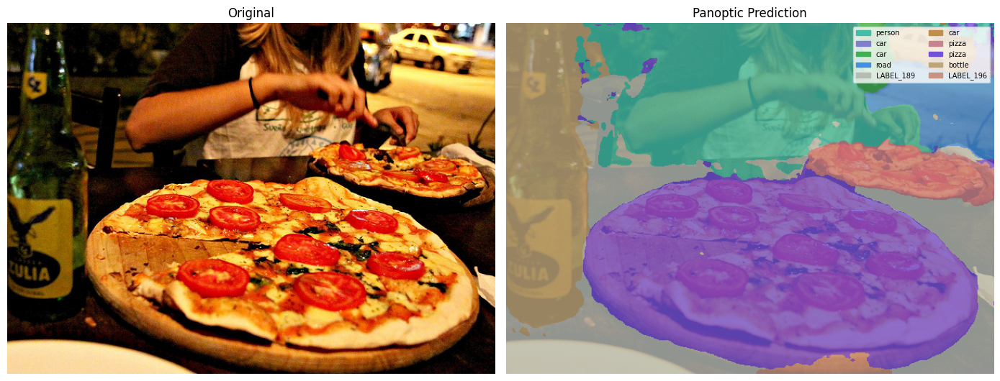

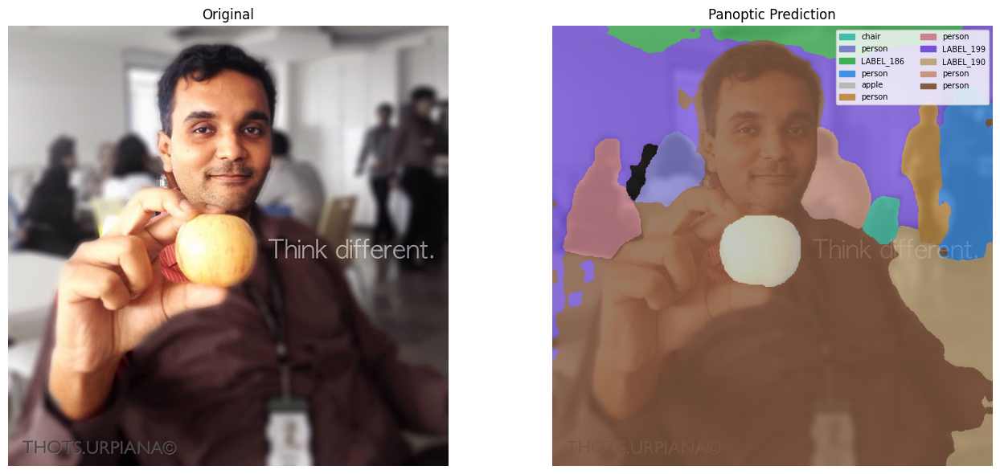

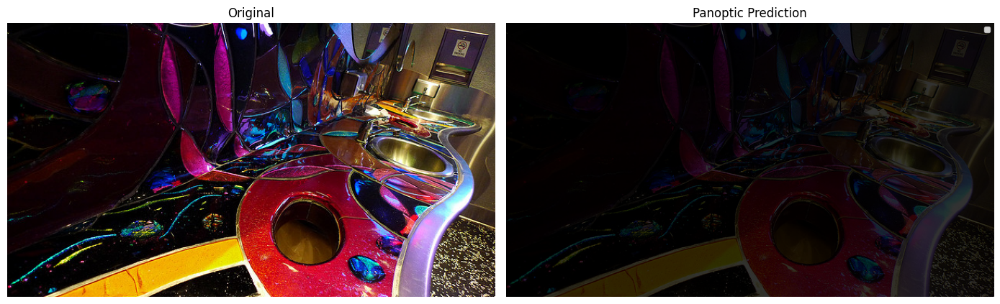

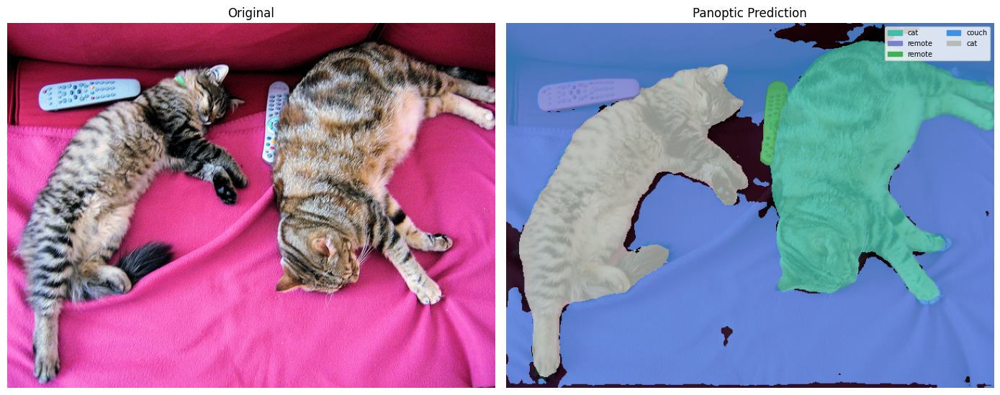

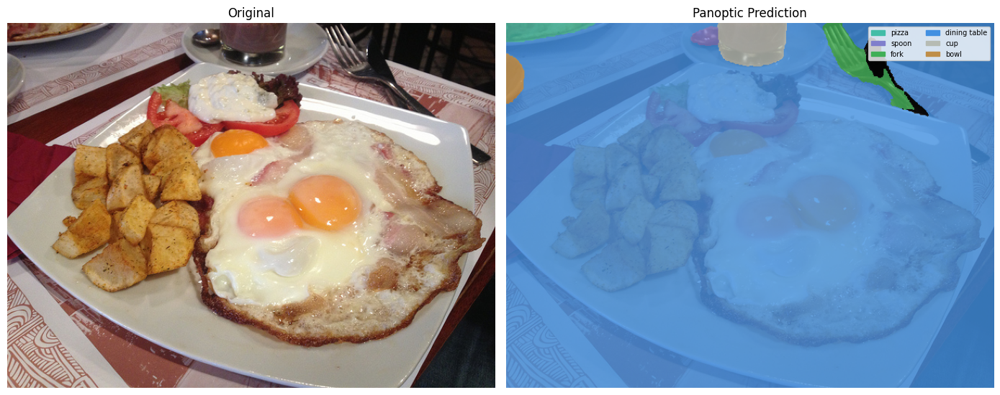

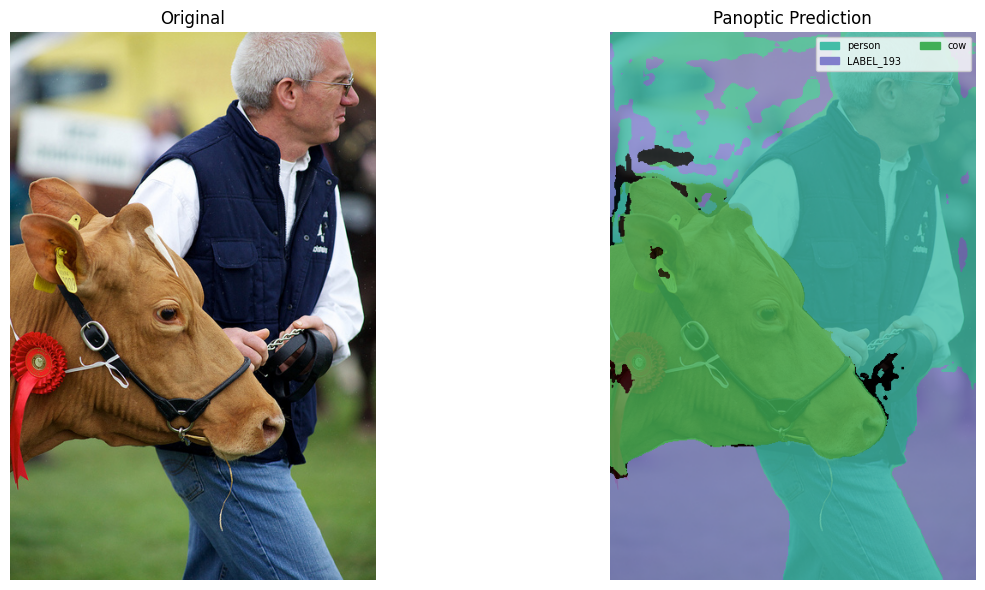

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image

from transformers import AutoConfig

def visualize_panoptic(image, result, id2label):
    seg   = result["segmentation"].numpy()
    infos = result["segments_info"]

    # Assign a random color per segment
    rng    = np.random.default_rng(42)
    colors = rng.integers(50, 230, size=(len(infos), 3))
    # segmentation shape
    h, w = seg.shape

    image = image.resize((w, h))

    canvas = np.zeros((h, w, 3), dtype=np.uint8)
    patches = []
    for color, info in zip(colors, infos):
        mask           = seg == info["id"]
        canvas[mask]   = color
        label          = id2label[info["label_id"]]
        tag            = label
        patches.append(mpatches.Patch(color=color/255, label=tag))

    # Fusion image with mask
    canvas = Image.fromarray(canvas)
    canvas = Image.blend(image, canvas, 0.8)

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    axes[0].imshow(image)
    axes[0].set_title("Original")
    axes[0].axis("off")
    axes[1].imshow(canvas)
    axes[1].set_title("Panoptic Prediction")
    axes[1].axis("off")
    axes[1].legend(handles=patches, loc="upper right", fontsize=7, ncol=2)
    plt.tight_layout()
    plt.show()

# COCO panoptic has 133 categories (80 things + 53 stuff)
cfg     = AutoConfig.from_pretrained("facebook/detr-resnet-50-panoptic")
id2label = cfg.id2label
for image, result in zip(pil_images, results):
    visualize_panoptic(image, result, id2label)

## 8.2 Swin and DinoV2 for classification

This section runs **inference-only** examples using pretrained checkpoints, so you can inspect baseline behavior before any task-specific fine-tuning.

We include:

1. **DINOv2 pretrained classifier** (`dinov2_vits14_lc`) top-5 predictions.
2. **Swin pretrained ImageNet model** top-5 predictions.
3. **DETR pretrained detector** with bounding box visualization on a sample image.

In [ ]:
import torch
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

# Pretrained DINOv2 and Swin top-k predictions on one validation image
TOP_K = 5   # how many predictions to print -- referenced in the labels below

imagenet_labels = Swin_T_Weights.IMAGENET1K_V1.meta['categories']

# Grab one sample from validation loader
# sample_batch = next(iter(val_loader))
# sample_x, sample_y = sample_batch[0][0:1].to(device), sample_batch[1][0].item()

tfms_224 = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

tfms_518 = transforms.Compose([
    transforms.Resize((518, 518)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

dinov2_pretrained_cls = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14_lc', force_reload=True).to(device).eval()
swin_pretrained = swin_t(weights=Swin_T_Weights.IMAGENET1K_V1).to(device).eval()

#gorilla_images = glob(f"{IMAGENET_ROOT}/gorilla/*.jpg"
#for img_path in gorilla_images[:3]:
test_imgs = [0,2,3,4]
for img in [ pil_images[i] for i in test_imgs]:
    fig, axes = plt.subplots(1, 3, figsize=(16, 4))

    # img = Image.open(img_path)
    #checking if image is RGB
    if img.mode != 'RGB':
        img = img.convert('RGB')
    #checking if image is grayscale
    if img.mode == 'L':
        img = img.convert('RGB')

    img_224 = tfms_224(img)
    img_518 = tfms_518(img)

    axes[0].imshow(img)
    axes[0].set_title("Original Image", fontsize=12)
    axes[0].axis("off")

    axes[1].imshow(img_224.cpu().permute(1, 2, 0).numpy())
    axes[1].set_title("224x224 Image (16x16 patches of 14px)", fontsize=12)
    axes[1].axis("off")

    axes[2].imshow(img_518.cpu().permute(1, 2, 0).numpy())
    # 518 is not arbitrary: 518 = 37 x 14, i.e. exactly 37x37 patches for DINOv2's /14 ViT.
    axes[2].set_title("518x518 Image (37x37 patches of 14px)", fontsize=12)
    axes[2].axis("off")

    plt.show()
    # ---- DINOv2 pretrained classifier (with linear head) ----
    # Note: this is a pretrained classification checkpoint, not the custom linear probe defined above.

    with torch.no_grad():
        dino_logits = dinov2_pretrained_cls(img_224.unsqueeze(0).to(device))
        dino_probs = torch.softmax(dino_logits, dim=1)
        dino_top_prob, dino_top_idx = torch.topk(dino_probs, k=TOP_K, dim=1)

        dino_logits_518 = dinov2_pretrained_cls(img_518.unsqueeze(0).to(device))
        dino_probs_518 = torch.softmax(dino_logits_518, dim=1)
        dino_top_prob_518, dino_top_idx_518 = torch.topk(dino_probs_518, k=TOP_K, dim=1)

    print("="*50)
    print(f'\nDINOv2 pretrained top-{TOP_K} predictions | 224x224:')
    for rank, (idx, prob) in enumerate(zip(dino_top_idx[0].cpu().tolist(), dino_top_prob[0].cpu().tolist()), start=1):
        print(f'{rank}. {imagenet_labels[idx]} ({prob:.4f})')

    print(f"\nDINOv2 pretrained top-{TOP_K} predictions | 518x518:")
    for rank, (idx, prob) in enumerate(zip(dino_top_idx_518[0].cpu().tolist(), dino_top_prob_518[0].cpu().tolist()), start=1):
        print(f'{rank}. {imagenet_labels[idx]} ({prob:.4f})')

    with torch.no_grad():
        swin_logits = swin_pretrained(img_224.unsqueeze(0).to(device))
        swin_probs = torch.softmax(swin_logits, dim=1)
        swin_top_prob, swin_top_idx = torch.topk(swin_probs, k=TOP_K, dim=1)

        swin_logits_518 = swin_pretrained(img_518.unsqueeze(0).to(device))
        swin_probs_518 = torch.softmax(swin_logits_518, dim=1)
        swin_top_prob_518, swin_top_idx_518 = torch.topk(swin_probs_518, k=TOP_K, dim=1)

    print(f'\nSwin pretrained top-{TOP_K} predictions | 224x224:')
    for rank, (idx, prob) in enumerate(zip(swin_top_idx[0].cpu().tolist(), swin_top_prob[0].cpu().tolist()), start=1):
        print(f'{rank}. {imagenet_labels[idx]} ({prob:.4f})')

    print(f"\nSwin pretrained top-{TOP_K} predictions | 518x518:")
    for rank, (idx, prob) in enumerate(zip(swin_top_idx_518[0].cpu().tolist(), swin_top_prob_518[0].cpu().tolist()), start=1):
        print(f'{rank}. {imagenet_labels[idx]} ({prob:.4f})')


### Summary and Notes !
- *Swin-T classifier is strongly tuned* to ImageNet-style classification at a fixed recipe (typically 224x224 with specific crop statistics).
Doubling resolution changes texture frequency, object scale, and patch distribution, so features can shift from what its head expects.

- *DINOv2 features are more scale-robust because self-supervised pretraining* (multi-crop / global-local views) teaches invariance across different crop sizes and object scales.
So when resolution changes, embeddings remain more stable.

- *Windowed attention in Swin is local by design*.
At higher resolution, the same object spans more patches/windows; local context composition changes, and the pretrained classifier head may not generalize as well without retuning.

- *Linear classification head sensitivity*:
For Swin pretrained on a specific data distribution, logits can degrade if input statistics shift.
DINOv2 pretrained representations are often more transferable and robust under such shifts.

- Preprocessing mismatch can amplify this:
If resizing/normalization/cropping differs from pretrained expectations, Swin can drop faster than DINOv2.

## 8.3 DETR example (COCO object detection)

DETR treats detection as a **set prediction** task (section 7.1). This section:

1. Loads COCO validation images.
2. Runs pretrained DETR inference on one image and draws the surviving boxes.
3. Then runs over a small COCO subset and reports two simple statistics: **detections per image** and the **confidence distribution** of the kept boxes.

Those two statistics are worth looking at because they show what the confidence threshold is really doing — DETR always emits exactly 100 predictions per image, and the threshold is the only thing standing between you and 100 boxes on every photo.

For a proper detection metric (**mAP@[.5:.95]**, the COCO primary metric) you need `pycocotools` and the COCO eval API — that is out of scope here, and the statistics below are *not* a substitute for it. They describe the predictions; they say nothing about whether the predictions are correct.

loading annotations into memory...
Done (t=0.49s)
creating index...
index created!
Downloading: "https://github.com/facebookresearch/detr/zipball/main" to /root/.cache/torch/hub/main.zip


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 219MB/s]


Downloading: "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" to /root/.cache/torch/hub/checkpoints/detr-r50-e632da11.pth


100%|██████████| 159M/159M [00:00<00:00, 239MB/s]


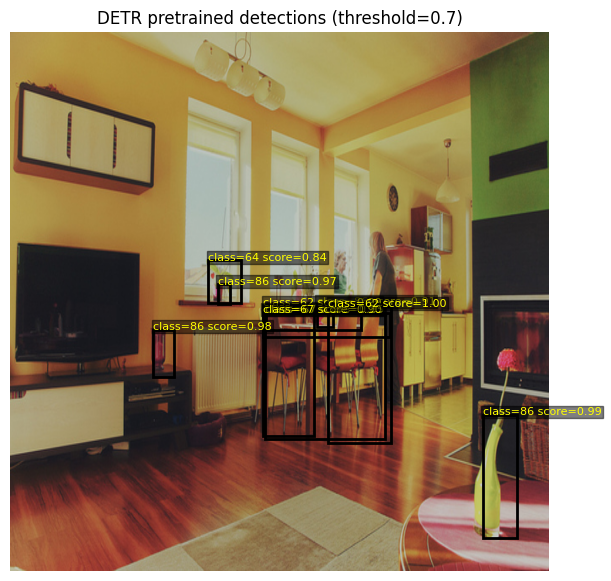

Kept detections: 10 out of 100 object queries


In [ ]:
from PIL import Image
import matplotlib.patches as patches
import torchvision.transforms.functional as F

# Load COCO val dataset
coco_val = CocoDetection(
    root=str(COCO_VAL_IMAGES),
    annFile=str(COCO_VAL_ANN),
    transform=transforms.Compose([
        transforms.Resize((800, 800)),
        transforms.ToTensor(),
    ])
)

coco_subset = Subset(coco_val, list(range(min(COCO_SUBSET_SIZE, len(coco_val)))))

sample_image_path = Path('./data/coco_sample.jpg')
if sample_image_path.exists():
    pil_img = Image.open(sample_image_path).convert('RGB')
else:
    # Fallback: use first image from COCO subset
    pil_img, _ = coco_subset[0]
    if isinstance(pil_img, torch.Tensor):
        pil_img = transforms.ToPILImage()(pil_img)

# DETR expects normalized tensor input
detr = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
detr = detr.to(device).eval()

detr_infer_tfms = transforms.Compose([
    transforms.Resize((800, 800)),
    transforms.ToTensor(),
])

x = detr_infer_tfms(pil_img).unsqueeze(0).to(device)

with torch.no_grad():
    out = detr(x)

# out['pred_logits'] is [batch, 100 queries, 92 classes]: the 91 COCO classes PLUS the
# special "no object" class the Hungarian matcher assigns to unmatched queries (section 7.1).
# That extra class always sits LAST, so [:, :, :-1] drops it -- we softmax over all 92
# (so the no-object probability still competes) and then only look at the real classes.
# A query that DETR decided is empty ends up with low scores everywhere here, and the
# threshold below removes it. This is what replaces NMS.
NO_OBJECT_LAST = -1
probas = out['pred_logits'].softmax(-1)[0, :, :NO_OBJECT_LAST]
scores, labels = probas.max(-1)
keep = scores > 0.7   # of the 100 queries, how many claim a real object confidently?
boxes = out['pred_boxes'][0, keep].detach().cpu()
labels_kept = labels[keep].detach().cpu()
scores_kept = scores[keep].detach().cpu()

# Convert cx,cy,w,h (normalized) -> x1,y1,w,h in pixel coords
w_img, h_img = pil_img.size
fig, ax = plt.subplots(1, 1, figsize=(10, 7))
ax.imshow(pil_img)

for b, cls_id, sc in zip(boxes, labels_kept, scores_kept):
    cx, cy, bw, bh = b.tolist()
    x1 = (cx - bw / 2.0) * w_img
    y1 = (cy - bh / 2.0) * h_img
    rect_w = bw * w_img
    rect_h = bh * h_img

    rect = patches.Rectangle((x1, y1), rect_w, rect_h, fill=False, linewidth=2)
    ax.add_patch(rect)
    ax.text(x1, y1, f'class={int(cls_id)} score={float(sc):.2f}', color='yellow', fontsize=8,
            bbox=dict(facecolor='black', alpha=0.5, pad=1))

ax.set_title('DETR pretrained detections (threshold=0.7)')
ax.axis('off')
plt.show()

print(f'Kept detections: {int(keep.sum().item())} out of {probas.shape[0]} object queries')

Images processed:        12
Object queries per image: 100  (fixed by the architecture)
Kept at conf > 0.7:      8.5 per image on average (min 0, max 52)
So ~92% of queries are effectively saying "no object".


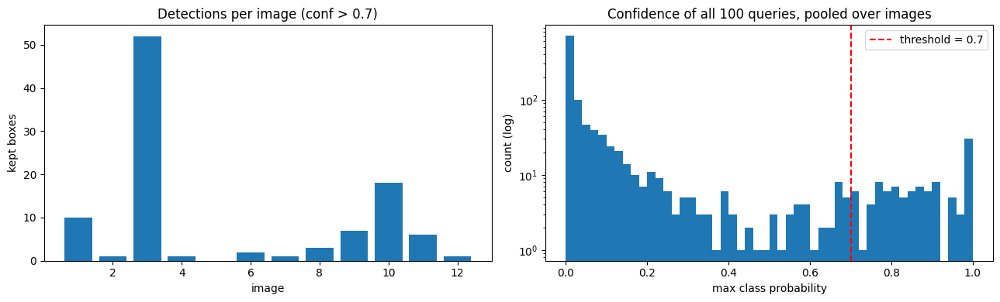

In [ ]:
# --- The two statistics section 8.3 promised: detections/image and confidence spread ---
# DETR emits exactly 100 predictions for EVERY image. The confidence threshold is the only
# thing between you and 100 boxes per photo, so it is worth seeing what it actually removes.

N_STATS_IMAGES = min(12, len(coco_subset))   # keep it small: this is ~1s/image on GPU, slower on CPU
CONF_THRESHOLD = 0.7

per_image_counts = []
all_scores = []

with torch.no_grad():
    for i in range(N_STATS_IMAGES):
        img_t, _ = coco_subset[i]                      # already Resize((800,800)) + ToTensor
        out_i = detr(img_t.unsqueeze(0).to(device))

        p = out_i['pred_logits'].softmax(-1)[0, :, :NO_OBJECT_LAST]   # drop the no-object class
        s, _ = p.max(-1)
        s = s.detach().cpu()

        kept = (s > CONF_THRESHOLD)
        per_image_counts.append(int(kept.sum().item()))
        all_scores.append(s)

all_scores = torch.cat(all_scores).numpy()

print(f'Images processed:        {N_STATS_IMAGES}')
print(f'Object queries per image: {out_i["pred_logits"].shape[1]}  (fixed by the architecture)')
print(f'Kept at conf > {CONF_THRESHOLD}:      {np.mean(per_image_counts):.1f} per image on average '
      f'(min {min(per_image_counts)}, max {max(per_image_counts)})')
print(f'So ~{100 * (1 - np.mean(per_image_counts) / 100):.0f}% of queries are effectively saying "no object".')

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

axes[0].bar(range(1, N_STATS_IMAGES + 1), per_image_counts)
axes[0].set_title(f'Detections per image (conf > {CONF_THRESHOLD})')
axes[0].set_xlabel('image')
axes[0].set_ylabel('kept boxes')

axes[1].hist(all_scores, bins=50)
axes[1].axvline(CONF_THRESHOLD, color='red', linestyle='--', label=f'threshold = {CONF_THRESHOLD}')
axes[1].set_title('Confidence of all 100 queries, pooled over images')
axes[1].set_xlabel('max class probability')
axes[1].set_ylabel('count (log)')
axes[1].set_yscale('log')
axes[1].legend()

plt.tight_layout()
plt.show()

# Read the right-hand plot: the big spike near 0 is the queries that matched the no-object
# class during training -- the set-prediction loss from 7.1 pushed them there on purpose.
# The sparse tail on the right is the actual detections. A well-trained DETR is bimodal;
# that separation is what lets a single threshold work without NMS.

# NOTE: none of this measures whether the boxes are CORRECT. For that you need
# mAP@[.5:.95] via pycocotools and the ground-truth annotations we loaded into coco_val.

<a id="9" />

# References

## Core papers for this class

- [DINO — Emerging Properties in Self-Supervised Vision Transformers](https://arxiv.org/pdf/2104.14294) *(the original self-distillation method, section 2)*
- [DINOv2: Learning Robust Visual Features without Supervision](https://arxiv.org/pdf/2304.07193)
- [DINOv3](https://arxiv.org/pdf/2508.10104)
- [iBOT — Image BERT Pre-Training with Online Tokenizer](https://arxiv.org/pdf/2111.07832) *(the masked-patch objective in section 2.4)*
- [Vision Transformers Need Registers](https://arxiv.org/pdf/2309.16588) *(register tokens, section 5.2)*
- [Swin Transformer: Hierarchical Vision Transformer using Shifted Windows](https://arxiv.org/pdf/2103.14030)
- [DETR — End-to-End Object Detection with Transformers](https://arxiv.org/pdf/2005.12872)
- [Panoptic Segmentation](https://arxiv.org/pdf/1801.00868) *(defines the thing/stuff split and the PQ metric, section 7.3)*
- [A ConvNet for the 2020s (ConvNeXt)](https://arxiv.org/pdf/2201.03545) *(the DINOv3 convolutional backbone)*

## Supporting techniques

- [Distilling the Knowledge in a Neural Network](https://arxiv.org/pdf/1503.02531) *(Hinton et al., 2015)*
- [Vision Transformers for Dense Prediction (DPT)](https://arxiv.org/pdf/2103.13413)
- [GLU Variants Improve Transformer (SwiGLU)](https://arxiv.org/pdf/2002.05202)
- [KoLeo — Spreading Vectors for Similarity Search](https://arxiv.org/pdf/1806.03198)
- [RoFormer: Enhanced Transformer with Rotary Position Embedding (RoPE)](https://arxiv.org/pdf/2104.09864)

## Where DETR went next (section 7.4)

- [Deformable DETR](https://arxiv.org/pdf/2010.04159) *(sparse attention, ~10× faster convergence)*
- [DINO — DETR with Improved deNoising anchOr boxes](https://arxiv.org/pdf/2203.03605) *(the **detector** called DINO — not the self-supervised method in section 2)*
- [RT-DETR — Real-Time Detection Transformer](https://arxiv.org/pdf/2304.08069)
- [D-FINE](https://arxiv.org/pdf/2410.13842)